In [1]:
#calculate depth and area averaged time-series in JRA-55 ACCESS=OM2-025-IAF runs and write to file
#evaluate specific ENSO events across IAF runs relative to longterm and decadal means

In [8]:
import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import xarray as xr
import cartopy.crs as ccrs
import cmocean as cm
from collections import OrderedDict
import cftime
import glob

import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client
import matplotlib.path as mpath

In [9]:
client = Client(n_workers=8)
client

Client Scheduler: tcp://127.0.0.1:36323 Dashboard: /proxy/41983/status,Cluster Workers: 8 Cores: 8 Memory: 100.00 GiB


In [10]:
session = cc.database.create_session('/g/data/ik11/databases/cosima_master.db')

In [ ]:
from cosima_cookbook import explore
dbx = explore.DatabaseExplorer #(session=session)
dbx

In [ ]:
ee = explore.ExperimentExplorer(session=session, experiment='01deg_jra55v140_iaf')
ee

In [11]:
import cartopy.feature as cft
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m',
                                   edgecolor='black', facecolor='gray', linewidth=0.5)

In [12]:
expt='025deg_jra55_iaf_omip2_cycle3'

In [13]:
variable='ht'
ht = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
ht.load()
print(ht.shape)

variable='hu'
hu = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
hu.load()
print(hu.shape)

(1080, 1440)
(1080, 1440)


In [14]:
variable='xt_ocean'
xt_ocean = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
xt_ocean.load()
print(xt_ocean.values)

variable='yt_ocean'
yt_ocean = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
yt_ocean.load()
print(yt_ocean.shape)

variable='area_t'
area_t = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
area_t.load()
print(area_t.shape)

variable='xu_ocean'
xu_ocean = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
xu_ocean.load()
print(xu_ocean.values)

variable='yu_ocean'
yu_ocean = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
yu_ocean.load()
print(yu_ocean.shape)

variable='area_u'
area_u = cc.querying.getvar(expt,variable,session, n=-1).fillna(1.0).astype(int) - 1
area_u.load()
print(area_u.shape)

[-280 -280 -280 ...   78   78   78]
(1080,)
(1080, 1440)
[-280 -280 -280 ...   78   78   79]
(1080,)
(1080, 1440)


#get long-term average
expt='025deg_jra55_iaf_omip2_cycle3'
start = '1971-01-01 00:00:00'
end = '2017-12-31 00:00:00'
ltm_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean(dim='time').chunk({'st_ocean':25, 'yt_ocean':540, 'xt_ocean':720})
#temp.load()
ltm_temp.load()
ltm_temp.shape

ltm_temp.to_dataset(name='ltm_temp').to_netcdf('ltm_temp_025_cycle3.nc')

In [15]:
#adele code to create dzt
ltm_temp=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/ltm_temp_025_cycle2.nc',engine='netcdf4',decode_times=False)
ltm_temp.ltm_temp.shape

start = '1971-01-01 00:00:00'
end = '1971-01-31 00:00:00'

st_edges_ocean = cc.querying.getvar('025deg_jra55_iaf_omip2_cycle4','st_edges_ocean',session,
                 start_time=start, end_time=end,n=1)
st_edges_array = st_edges_ocean.expand_dims({'yt_ocean':ltm_temp.yt_ocean,'xt_ocean':ltm_temp.xt_ocean},axis=[1,2])

# import bathymetry:
ht = cc.querying.getvar('025deg_jra55_iaf_omip2_cycle4','ht',session,n=1)

# adjust edges at bottom for partial thickness:
st_edges_with_partial = st_edges_array.where(st_edges_array<ht,other=ht)
thickness = st_edges_with_partial.diff(dim='st_edges_ocean')

# change coordinate of thickness to st_ocean (needed for multipling with other variables):
st_ocean = cc.querying.getvar('025deg_jra55_iaf_omip2_cycle4','st_ocean',session,n=1)
thickness['st_edges_ocean'] = st_ocean.values
thickness = thickness.rename(({'st_edges_ocean':'st_ocean'}))

z1=200
z2=500
thickness = thickness.sel(st_ocean=slice(z1,z2))

The Bellingshausen Sea is an area along the west side of the Antarctic Peninsula between 57°18'W and 102°20'W, west of Alexander Island, east of Cape Flying Fish on Thurston Island, and south of Peter I Island (there the southern Vostokkysten).

The Amundsen Sea, an arm of the Southern Ocean off Marie Byrd Land in western Antarctica, lies between Cape Flying Fish (the northwestern tip of Thurston Island) to the east and Cape Dart on Siple Island to the west.

Cape Flying Fish (72°3′S 102°20′WCoordinates: 72°3′S 102°20′W
Cape Dart (73°7′S 126°9′WCoordinates: 73°7′S 126°9′W)

Marie Byrd Land is the portion of West Antarctica lying east of the Ross Ice Shelf and the Ross Sea and south of the Pacific Ocean, extending eastward approximately to a line between the head of the Ross Ice Shelf and Eights Coast. It stretches between 158°W and 103°24'W. 

WAP range
i=821 to 872

BS range
i=716 to i=820

AS range
i=613 to i=714

In [ ]:
#do maskito_netcdfepths = (0,300)
#htmask = temp.where(~xr.ufuncs.isfinite(temp.where(ht>1000)))
#htmask = ~xr.ufuncs.isnan(htmask).to_dataset(name='htmask')
#htmask

#var.where((var.lat<5) & (var.lat>-5) & (var.lon>190) & (var.lon<240),drop=True

umask = hu.where(~xr.ufuncs.isfinite(hu.where(hu>1000)))
umask = umask.where(~xr.ufuncs.isfinite(umask.where(yu_ocean>-60)))
umask = ~xr.ufuncs.isnan(umask).to_dataset(name='umask')
print(umask.umask.shape)

#wap_mask = ht.where(~xr.ufuncs.isfinite(ht.where( (ht>1000) & (yt_ocean>-60) & (xt_ocean<-75) & (xt_ocean>-63) )))
wap_umask = hu.where(~xr.ufuncs.isfinite(hu.where(hu>1000)))
wap_umask = wap_umask.where(~xr.ufuncs.isfinite(wap_umask.where(yu_ocean>-60)))
wap_umask=wap_umask.where(~xr.ufuncs.isfinite(wap_umask.where(xu_ocean<-75)))
wap_umask=wap_umask.where(~xr.ufuncs.isfinite(wap_umask.where(xu_ocean>-63)))
wap_umask = ~xr.ufuncs.isnan(wap_umask).to_dataset(name='wap_umask')
print(wap_umask.wap_umask.shape)

#bs_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-101) & (xt_ocean>-76) )))
bs_umask = hu.where(~xr.ufuncs.isfinite(hu.where(hu>1000)))
bs_umask = bs_umask.where(~xr.ufuncs.isfinite(bs_umask.where(yu_ocean>-60)))
bs_umask=bs_umask.where(~xr.ufuncs.isfinite(bs_umask.where(xu_ocean<-101)))
bs_umask=bs_umask.where(~xr.ufuncs.isfinite(bs_umask.where(xu_ocean>-76)))
bs_umask = ~xr.ufuncs.isnan(bs_umask).to_dataset(name='bs_umask')
print(bs_umask.bs_umask.shape)

#as_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-127) & (xt_ocean>-102) )))
as_umask = hu.where(~xr.ufuncs.isfinite(hu.where(hu>1000)))
as_umask = as_umask.where(~xr.ufuncs.isfinite(as_umask.where(yu_ocean>-60)))
as_umask=as_umask.where(~xr.ufuncs.isfinite(as_umask.where(xu_ocean<-127)))
as_umask=as_umask.where(~xr.ufuncs.isfinite(as_umask.where(xu_ocean>-102)))
as_umask = ~xr.ufuncs.isnan(as_umask).to_dataset(name='as_umask')
print(as_umask.as_umask.shape)

#mb_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-158) & (xt_ocean>-103) )))
mb_umask = hu.where(~xr.ufuncs.isfinite(hu.where(hu>1000)))
mb_umask = mb_umask.where(~xr.ufuncs.isfinite(mb_umask.where(yu_ocean>-60)))
mb_umask=mb_umask.where(~xr.ufuncs.isfinite(mb_umask.where(xu_ocean<-158)))
mb_umask=mb_umask.where(~xr.ufuncs.isfinite(mb_umask.where(xu_ocean>-103)))
mb_umask = ~xr.ufuncs.isnan(mb_umask).to_dataset(name='mb_umask')
print(mb_umask.mb_umask.shape)
#wap_tmask.plot

In [ ]:
#do maskito_netcdfepths = (0,300)
#htmask = temp.where(~xr.ufuncs.isfinite(temp.where(ht>1000)))
#htmask = ~xr.ufuncs.isnan(htmask).to_dataset(name='htmask')
#htmask

#var.where((var.lat<5) & (var.lat>-5) & (var.lon>190) & (var.lon<240),drop=True

tmask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
tmask = tmask.where(~xr.ufuncs.isfinite(tmask.where(yt_ocean>-60)))
tmask = ~xr.ufuncs.isnan(tmask).to_dataset(name='tmask')

#wap_mask = ht.where(~xr.ufuncs.isfinite(ht.where( (ht>1000) & (yt_ocean>-60) & (xt_ocean<-75) & (xt_ocean>-63) )))
wap_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
wap_mask = wap_mask.where(~xr.ufuncs.isfinite(wap_mask.where(yt_ocean>-60)))
wap_mask=wap_mask.where(~xr.ufuncs.isfinite(wap_mask.where(xt_ocean<-75)))
wap_mask=wap_mask.where(~xr.ufuncs.isfinite(wap_mask.where(xt_ocean>-63)))
wap_mask = ~xr.ufuncs.isnan(wap_mask).to_dataset(name='wap_mask')

#bs_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-101) & (xt_ocean>-76) )))
bs_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
bs_mask = bs_mask.where(~xr.ufuncs.isfinite(bs_mask.where(yt_ocean>-60)))
bs_mask=bs_mask.where(~xr.ufuncs.isfinite(bs_mask.where(xt_ocean<-101)))
bs_mask=bs_mask.where(~xr.ufuncs.isfinite(bs_mask.where(xt_ocean>-76)))
bs_mask = ~xr.ufuncs.isnan(bs_mask).to_dataset(name='bs_mask')

#as_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-127) & (xt_ocean>-102) )))
as_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
as_mask = as_mask.where(~xr.ufuncs.isfinite(as_mask.where(yt_ocean>-60)))
as_mask=as_mask.where(~xr.ufuncs.isfinite(as_mask.where(xt_ocean<-127)))
as_mask=as_mask.where(~xr.ufuncs.isfinite(as_mask.where(xt_ocean>-102)))
as_mask = ~xr.ufuncs.isnan(as_mask).to_dataset(name='as_mask')

#mb_mask = ht.where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-158) & (xt_ocean>-103) )))
mb_mask = ht.where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
mb_mask = mb_mask.where(~xr.ufuncs.isfinite(mb_mask.where(yt_ocean>-60)))
mb_mask=mb_mask.where(~xr.ufuncs.isfinite(mb_mask.where(xt_ocean<-158)))
mb_mask=mb_mask.where(~xr.ufuncs.isfinite(mb_mask.where(xt_ocean>-103)))
mb_mask = ~xr.ufuncs.isnan(mb_mask).to_dataset(name='mb_mask')
#wap_tmask.plot

In [ ]:
expt='025deg_jra55_iaf_omip2_cycle5'

#do DJF,MAM,JJA,SON
start = '1958-12-01 00:00:00'
end = '2018-12-01 00:00:00'
tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end))
#tx

tx = tx.resample({'time':'QS-Mar'}).mean()
#tx

#for i, ds in tx.resample({'time': 'QS-Mar'}):
#    print(i, ds)

print(tx.shape,tx.shape[0])

txx=np.zeros((5,tx.shape[0]))
txx[0,:]=tx.where(umask.umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
txx[1,:]=tx.where(wap_umask.wap_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
txx[2,:]=tx.where(bs_umask.bs_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
txx[3,:]=tx.where(as_umask.as_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
txx[4,:]=tx.where(mb_umask.mb_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/tx_025_cyc5_ts_seasonal_581201to181201.npy',txx)

In [57]:
expt='025deg_jra55_iaf_omip2_cycle5'

#do DJF,MAM,JJA,SON
start = '1958-12-01 00:00:00'
end = '2018-12-01 00:00:00'
ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end))
print(ty)

ty = ty.resample({'time':'QS-Mar'}).mean()
#ty

print(ty.shape,ty.shape[0])

tyy=np.zeros((5,ty.shape[0]))
tyy[0,:]=ty.where(umask.umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[1,:]=ty.where(wap_umask.wap_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[2,:]=ty.where(bs_umask.bs_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[3,:]=ty.where(as_umask.as_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[4,:]=ty.where(mb_umask.mb_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/ty_025_cyc5_ts_seasonal_581201to181201.npy',tyy)

<xarray.DataArray 'tau_y' (time: 720, yu_ocean: 1080, xu_ocean: 1440)>
dask.array<getitem, shape=(720, 1080, 1440), dtype=float32, chunksize=(1, 216, 240), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) datetime64[ns] 1958-12-14T12:00:00 ... 2018-11-14
  * xu_ocean  (xu_ocean) float64 -279.8 -279.5 -279.2 -279.0 ... 79.5 79.75 80.0
  * yu_ocean  (yu_ocean) float64 -81.02 -80.92 -80.81 ... 89.79 89.89 90.0
Attributes:
    long_name:      j-directed wind stress forcing v-velocity
    units:          N/m^2
    valid_range:    [-10.  10.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_c geolat_c
    standard_name:  surface_downward_y_stress
    time_bounds:    <xarray.DataArray 'time_bounds' (time: 732, nv: 2)>\ndask...


distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


(240, 1080, 1440) 240


distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

In [16]:
expt='025deg_jra55_iaf_omip2_cycle5'

#do DJF,MAM,JJA,SON
start = '1958-12-01 00:00:00'
end = '2018-12-01 00:00:00'
ssh = cc.querying.getvar(expt, variable='sea_level', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end))
print(ssh)

ssh = ssh.resample({'time':'QS-Mar'}).mean()
#ty

print(ssh.shape,ssh.shape[0])

sh=np.zeros((5,ssh.shape[0]))
sh[0,:]=ssh.where(tmask.tmask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
sh[1,:]=ssh.where(wap_mask.wap_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
sh[2,:]=ssh.where(bs_mask.bs_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
sh[3,:]=ssh.where(as_mask.as_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
sh[4,:]=ssh.where(mb_mask.mb_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/ssh_025_cyc5_ts_seasonal_581201to181201.npy',sh)

<xarray.DataArray 'sea_level' (time: 720, yt_ocean: 1080, xt_ocean: 1440)>
dask.array<getitem, shape=(720, 1080, 1440), dtype=float32, chunksize=(1, 216, 240), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
  * yt_ocean  (yt_ocean) float64 -81.08 -80.97 -80.87 ... 89.74 89.84 89.95
  * time      (time) datetime64[ns] 1958-12-14T12:00:00 ... 2018-11-14
Attributes:
    long_name:      effective sea level (eta_t + patm/(rho0*g)) on T cells
    units:          meter
    valid_range:    [-1000.  1000.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    coordinates:    geolon_t geolat_t
    standard_name:  sea_surface_height_above_geoid
    time_bounds:    <xarray.DataArray 'time_bounds' (time: 732, nv: 2)>\ndask...
(240, 1080, 1440) 240


In [91]:
expts=['025deg_jra55_iaf_omip2_cycle1','025deg_jra55_iaf_omip2_cycle2','025deg_jra55_iaf_omip2_cycle3','025deg_jra55_iaf_omip2_cycle4','025deg_jra55_iaf_omip2_cycle5']
expt='025deg_jra55_iaf_omip2_cycle5'
#DJF,MAM ... dates
#start = '1958-12-01 00:00:00'
#end = '2018-12-01 00:00:00'

start = '1958-01-01 00:00:00'
end = '2019-01-01 00:00:00'

In [92]:
ds = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end))

In [93]:
#check that xarray handles z dim differences between temp and mask
thickness*ds.isel(time=0)

<xarray.DataArray (st_ocean: 5, yt_ocean: 1080, xt_ocean: 1440)>
dask.array<mul, shape=(5, 1080, 1440), dtype=float64, chunksize=(5, 108, 120), chunktype=numpy.ndarray>
Coordinates:
  * st_ocean  (st_ocean) float64 228.2 268.3 314.8 368.7 430.8
  * yt_ocean  (yt_ocean) float64 -81.08 -80.97 -80.87 ... 89.74 89.84 89.95
  * xt_ocean  (xt_ocean) float64 -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
    geolat_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(216, 240), meta=np.ndarray>
    geolon_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(216, 240), meta=np.ndarray>
    time      datetime64[ns] 1958-01-14T12:00:00

In [94]:
%%time
t=ds.sel(time=slice(start,end)).sel(
    st_ocean=slice(z1,z2)).sel(yt_ocean=slice(-90,-55)).chunk({'st_ocean':None, 'yt_ocean':432, 'xt_ocean':1440})
#t = t.resample({'time':'QS-Mar'}).mean('time')
t = t.resample({'time':'Y'}).mean('time')
t

CPU times: user 374 ms, sys: 31.6 ms, total: 406 ms
Wall time: 406 ms


,Array,Chunk
Bytes,390.37 MiB,6.40 MiB
Shape,"(61, 5, 233, 1440)","(1, 5, 233, 1440)"
Count,468114 Tasks,61 Chunks
Type,float32,numpy.ndarray


In [95]:
%%time
t.compute()

CPU times: user 1min 13s, sys: 4.45 s, total: 1min 18s
Wall time: 2min 3s


<xarray.DataArray 'temp' (time: 61, st_ocean: 5, yt_ocean: 233, xt_ocean: 1440)>
array([[[[      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         ...,
         [273.40927, 273.36575, 273.3386 , ..., 273.63065, 273.53238,
          273.46762],
         [273.41367, 273.36423, 273.3422 , ..., 273.6891 , 273.57208,
          273.48636],
         [273.42148, 273.37466, 273.35815, ..., 273.6798 , 273.56674,
          273.48843]],

        [[      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
...
         [273.46796, 273.42624, 273.39642, ..., 273.68463, 273.6035 ,
          273.52856],
         [273.468  , 273.4264 , 273.39886, ..., 273.73843, 273.6337 ,
          273.53876],
         [273.47037, 273.43362, 273.40955, ..., 273.73816, 273.62704,
          273.53372]],

        [[      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         ...,
         [273.4244 , 273.38718, 273.36105, ..., 273.65778, 273.56335,
          273.48404],
         [273.42523, 273.3881 , 273.36356, ..., 273.7214 , 273.59573,
          273.49417],
         [273.42834, 273.39566, 273.3741 , ..., 273.7255 , 273.58835,
          273.48962]]]], dtype=float32)
Coordinates:
  * time      (time) datetime64[ns] 1958-12-31 1959-12-31 ... 2018-12-31
  * xt_ocean  (xt_ocean) float64 -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
  * yt_ocean  (yt_ocean) float64 -81.08 -80.97 -80.87 ... -55.42 -55.28 -55.14
  * st_ocean  (st_ocean) float64 228.2 268.3 314.8 368.7 430.8

In [96]:
#.sel(yt_ocean=slice(-90,-55)) ... xarray handles
t_zavg = (t*thickness).sum('st_ocean')/thickness.sum('st_ocean')

In [97]:
%%time
t_zavg.compute()

CPU times: user 1min 5s, sys: 3.09 s, total: 1min 8s
Wall time: 1min 50s


<xarray.DataArray (time: 61, yt_ocean: 233, xt_ocean: 1440)>
array([[[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        ...,
        [273.39855376, 273.35918513, 273.33782447, ..., 273.64962418,
         273.54097264, 273.46057852],
        [273.40243384, 273.35970526, 273.34216679, ..., 273.72120661,
         273.58284869, 273.478348  ],
        [273.41015392, 273.37055237, 273.35651656, ..., 273.72057811,
         273.57942961, 273.4800291 ]],

       [[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
...
        [273.35730819, 273.31943669, 273.29186772, ..., 273.59168076,
         273.49329638, 273.41317813],
        [273.35550143, 273.31375905, 273.28931587, ..., 273.65427861,
         273.52693286, 273.42354506],
        [273.35505371, 273.317438  , 273.29781119, ..., 273.6523523 ,
         273.51867215, 273.41802039]],

       [[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        ...,
        [273.4717187 , 273.43302769, 273.4057776 , ..., 273.66168636,
         273.58921643, 273.5258292 ],
        [273.47196271, 273.43214669, 273.40831711, ..., 273.70549788,
         273.6153933 , 273.535355  ],
        [273.4736472 , 273.43863111, 273.41927517, ..., 273.70298435,
         273.60852833, 273.53058799]]])
Coordinates:
  * yt_ocean  (yt_ocean) float64 -81.08 -80.97 -80.87 ... -55.42 -55.28 -55.14
  * time      (time) datetime64[ns] 1958-12-31 1959-12-31 ... 2018-12-31
  * xt_ocean  (xt_ocean) float64 -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
    geolat_t  (yt_ocean, xt_ocean) float32 nan nan nan ... -55.14 -55.14 -55.14
    geolon_t  (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.38 79.62 79.88

In [98]:
#t_zavg.to_dataset(name='temp_zavg').to_netcdf('ensoant/temp_zavg_025_cycle5_200to500_seasonal_581201to181201.nc')
t_zavg.to_dataset(name='temp_zavg').to_netcdf('ensoant/data/temp_zavg_025_cycle4_200to500_5801to1812.nc')
t_zavg

<xarray.DataArray (time: 61, yt_ocean: 233, xt_ocean: 1440)>
dask.array<truediv, shape=(61, 233, 1440), dtype=float64, chunksize=(1, 216, 240), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -81.08 -80.97 -80.87 ... -55.42 -55.28 -55.14
  * time      (time) datetime64[ns] 1958-12-31 1959-12-31 ... 2018-12-31
  * xt_ocean  (xt_ocean) float64 -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
    geolat_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(216, 240), meta=np.ndarray>
    geolon_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(216, 240), meta=np.ndarray>

In [99]:
#do area averaging of seasonal data
#t_zavg=xr.open_dataset('ensoant/temp_zavg_025_cycle5_200to500_seasonal_581201to181201.nc',engine='netcdf4',decode_times=False)
print(t_zavg.shape)

(61, 233, 1440)


In [100]:
as_t_avg = t_zavg.where(as_mask.as_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
print(as_t_avg.values)
#a=np.save('/g/data/v45/pas561/gdcc21/ensoant/as_temp_025_cycle5_200to500_seasonal_581201to181201.npy',as_t_avg.values)
a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_025_cycle4_200to500_5801to1812.npy',as_t_avg.values)

[273.16955812 273.16508873 273.1450769  272.90347205 272.88032295
 272.89850331 272.93319747 272.92370469 272.89830908 272.80852573
 272.68986882 272.61560187 272.42784828 272.23335761 272.10533269
 272.1111694  272.04871745 271.93439744 271.98578029 272.06620837
 272.20737676 272.31431797 272.50238855 272.63882706 272.73201824
 272.78366739 272.82155007 272.84250676 272.89359114 272.99527043
 272.99060228 272.95772492 272.88989169 272.96429541 273.06342185
 273.10457832 273.13212306 273.09636315 273.03763125 273.02489241
 273.04292951 272.98889709 272.96640539 273.02850264 273.14727574
 273.17384912 273.15760594 273.16732576 273.17796225 273.17979711
 273.09234684 272.97994756 272.9608345  272.85897294 272.8814318
 272.90023443 272.81689136 272.88205257 273.04134418 273.05749157
 273.09032832]


In [101]:
all = []
a=np.load('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_025_cycle1_200to500_5801to1812.npy')
all.append(a)
a=np.load('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_025_cycle2_200to500_5801to1812.npy')
all.append(a)
a=np.load('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_025_cycle3_200to500_5801to1812.npy')
all.append(a)
a=np.load('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_025_cycle4_200to500_5801to1812.npy')
all.append(a)
a=np.load('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_025_cycle5_200to500_5801to1812.npy')
all.append(a)

all=np.asarray(all)
print(all[4,:],all.shape)

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_025_cycle1to5_200to500_5801to1812.npy',all)

[273.1968871  273.20034912 273.17597    272.93597279 272.9275182
 272.94216639 272.96546941 272.9422612  272.9134126  272.8171571
 272.70532276 272.65165558 272.47349448 272.28485367 272.16755387
 272.19127833 272.13990648 272.03366948 272.11014344 272.19856
 272.33746074 272.45334942 272.64485273 272.77378847 272.85383913
 272.89679322 272.92073771 272.92032398 272.96717656 273.07522479
 273.06928284 273.03923284 272.97492026 273.0564783  273.15710081
 273.19562051 273.22617183 273.20188372 273.15397951 273.14650479
 273.15808575 273.09860791 273.07158799 273.13747887 273.26597556
 273.29824069 273.28686318 273.29614561 273.3047894  273.30761789
 273.20286014 273.07678526 273.04422234 272.93064925 272.96069148
 272.99612961 272.92411127 272.99385993 273.16779498 273.18819136
 273.21905366] (5, 61)


[273.1968871  273.20034912 273.17597    272.93597279 272.9275182
 272.94216639 272.96546941 272.9422612  272.9134126  272.8171571
 272.70532276 272.65165558 272.47349448 272.28485367 272.16755387
 272.19127833 272.13990648 272.03366948 272.11014344 272.19856
 272.33746074 272.45334942 272.64485273 272.77378847 272.85383913
 272.89679322 272.92073771 272.92032398 272.96717656 273.07522479
 273.06928284 273.03923284 272.97492026 273.0564783  273.15710081
 273.19562051 273.22617183 273.20188372 273.15397951 273.14650479
 273.15808575 273.09860791 273.07158799 273.13747887 273.26597556
 273.29824069 273.28686318 273.29614561 273.3047894  273.30761789
 273.20286014 273.07678526 273.04422234 272.93064925 272.96069148
 272.99612961 272.92411127 272.99385993 273.16779498 273.18819136
 273.21905366] (5, 61)


In [26]:
#check averaging 
#.sel(yt_ocean=slice(-90,-55)) ... yep all good.
#as_mask2 = ht.sel(yt_ocean=slice(-90,-55)).where(~xr.ufuncs.isfinite(ht.where((ht>1000) & (yt_ocean>-60) & (xt_ocean<-127) & (xt_ocean>-102) )))
as_mask2 = ht.sel(yt_ocean=slice(-90,-55)).where(~xr.ufuncs.isfinite(ht.where(ht>1000)))
as_mask2 = as_mask2.where(~xr.ufuncs.isfinite(as_mask2.where(yt_ocean>-60)))
as_mask2=as_mask2.where(~xr.ufuncs.isfinite(as_mask2.where(xt_ocean<-127)))
as_mask2=as_mask2.where(~xr.ufuncs.isfinite(as_mask2.where(xt_ocean>-102)))
as_mask2 = ~xr.ufuncs.isnan(as_mask2).to_dataset(name='as_mask2')

print(as_mask2)

as_t_avg2 = t_zavg.where(as_mask2.as_mask2).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
as_t_avg2.values

<xarray.Dataset>
Dimensions:   (xt_ocean: 1440, yt_ocean: 233)
Coordinates:
  * yt_ocean  (yt_ocean) float64 -81.08 -80.97 -80.87 ... -55.42 -55.28 -55.14
  * xt_ocean  (xt_ocean) float64 -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
    geolat_t  (yt_ocean, xt_ocean) float32 nan nan nan ... -55.14 -55.14 -55.14
    geolon_t  (yt_ocean, xt_ocean) float32 nan nan nan nan ... 79.38 79.62 79.88
Data variables:
    as_mask2  (yt_ocean, xt_ocean) bool dask.array<chunksize=(216, 240), meta=np.ndarray>


array([273.18047391, 273.16081174, 273.21188463, 273.23055658,
       273.236846  , 273.24242347, 273.15636454, 273.11874439,
       273.07970144, 272.98866525, 272.9036237 , 272.84931235,
       272.87303574, 272.94862376, 272.923818  , 272.93595373,
       272.94357263, 272.9415109 , 272.92164029, 272.94764059,
       272.98740088, 272.969283  , 272.94178794, 272.95916146,
       272.97665881, 272.94326752, 272.9694917 , 272.9077489 ,
       272.91726474, 272.94540869, 272.91697946, 272.87619907,
       272.89978853, 272.85869329, 272.79842355, 272.76034815,
       272.76021151, 272.72457614, 272.6490453 , 272.70234522,
       272.70703936, 272.67136643, 272.65487004, 272.61015954,
       272.59496509, 272.55745004, 272.44606523, 272.36918861,
       272.3733102 , 272.35510017, 272.31681866, 272.1740947 ,
       272.15030907, 272.15641306, 272.16486503, 272.18199   ,
       272.19823006, 272.21206959, 272.20113819, 272.15485232,
       272.20141191, 272.19985055, 272.14461696, 272.07

In [77]:
#to cycle thru years in chunks
all = []

for i, ds_dec in ds.resample({'time':'5YS'}):
    #print(i,ds_dec)
    t=ds_dec.sel(time=slice(start,end)).resample(time='Y').mean(dim='time').chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
    #temp.load()
    print(t.shape)
    print(thickness.shape)
    
    t = t.resample({'time':'QS-Mar'}).mean()

    t_zavg = (t*thickness).sum('st_ocean')/thickness.sum('st_ocean')
#    all.append(t_zavg.load())

#temp_zavg_all=xr.concat(all, dim='time')
#print(temp_zavg_all.shape)

#temp_zavg.to_dataset(name='temp_zavg').to_netcdf('temp_zavg_025_cycle2_200to500_79to98.nc')

(10, 50, 1080, 1440)
(10, 50, 1080, 1440)
(10, 50, 1080, 1440)
(10, 50, 1080, 1440)
(10, 50, 1080, 1440)
(10, 50, 1080, 1440)
(1, 50, 1080, 1440)


#seasonal depth averaged temp
expt='025deg_jra55_iaf_omip2_cycle5'

start = '1958-12-01 00:00:00'
end = '2018-12-01 00:00:00'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
print(temp)

temp = temp.resample({'time':'QS-Mar'}).mean()

print(temp.shape)
print(thickness.shape)

temp_zavg = (temp*thickness).sum('st_ocean')/thickness.sum('st_ocean')
temp_zavg = temp_zavg.load()

temp_zavg_all=xr.concat([temp_zavg_all, temp_zavg],dim='time')
print(temp_zavg_all.shape)

temp_zavg_all.to_dataset(name='temp_zavg').to_netcdf('temp_zavg_025_cycle5_200to500_seasonal_5811to1811.nc')

In [13]:
#annual means
ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).resample(time='Y').mean(dim='time')
print(ty.shape)

tyy=np.zeros((5,60))
tyy[0,:]=ty.where(umask.umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[1,:]=ty.where(wap_umask.wap_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[2,:]=ty.where(bs_umask.bs_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[3,:]=ty.where(as_umask.as_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))
tyy[4,:]=ty.where(mb_umask.mb_umask).weighted(area_u).mean(dim=('xu_ocean','yu_ocean'))

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/ty_025_cyc2_ts.npy',txx)

distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


(60, 1080, 1440)


distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

(60, 1080, 1440)


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


In [ ]:
expt='025deg_jra55_iaf_omip2_cycle5'

start = '1958-01-01 00:00:00'
end = '2017-12-31 00:00:00'
tx = cc.querying.getvar(expt, variable='sea_level', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).resample(time='Y').mean(dim='time')
print(tx.shape)

ssh=np.zeros((5,60))
ssh[0,:]=x.where(tmask.tmask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ssh[1,:]=x.where(wap_mask.wap_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ssh[2,:]=x.where(bs_mask.bs_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ssh[3,:]=x.where(as_mask.as_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ssh[4,:]=x.where(mb_mask.mb_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/ssh_025_cyc5_ts.npy',ssh)

(60, 1080, 1440)


In [ ]:
expt='025deg_jra55_iaf_omip2_cycle3'

start = '1958-01-01 00:00:00'
end = '2017-12-31 00:00:00'
x = cc.querying.getvar(expt, variable='hi_m', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).resample(time='Y').mean(dim='time')
print(x.shape)
x

#relable CICE coords to MOM
x.coords['ni'] = geolon_t['xt_ocean'].values
x.coords['nj'] = geolon_t['yt_ocean'].values
#Rename function from xarray uses dictionaries to change names. Keys refer to current names and values are the desired names
x = x.rename(({'ni':'xt_ocean', 'nj':'yt_ocean'}))


hi=np.zeros((5,60))
hi[0,:]=x.where(tmask.tmask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[1,:]=x.where(wap_mask.wap_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[2,:]=x.where(bs_mask.bs_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[3,:]=x.where(as_mask.as_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[4,:]=x.where(mb_mask.mb_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/hi_025_cyc3_ts.npy',ssh)

In [ ]:
expt='025deg_jra55_iaf_omip2_cycle5'

start = '1958-01-01 00:00:00'
end = '2017-12-31 00:00:00'
x = cc.querying.getvar(expt, variable='HI', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).resample(time='Y').mean(dim='time')
print(x.shape)

hi=np.zeros((5,60))
hi[0,:]=x.where(tmask.tmask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[1,:]=x.where(wap_mask.wap_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[2,:]=x.where(bs_mask.bs_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[3,:]=x.where(as_mask.as_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
hi[4,:]=x.where(mb_mask.mb_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/hi_025_cyc5_ts.npy',ssh)

In [ ]:
#get long-term average

expt='025deg_jra55_iaf_omip2_cycle5'

start = '1971-01-01 00:00:00'
end = '1991-12-31 00:00:00'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean(dim='time').chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
#temp.load()
ltm1=temp.load()
print(ltm1.shape)

start = '1992-01-01 00:00:00'
end = '2005-12-31 00:00:00'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean(dim='time').chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
#temp.load()
ltm2=temp.load()
print(ltm2.shape)

start = '2006-01-01 00:00:00'
end = '2017-12-31 00:00:00'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean(dim='time').chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
#temp.load()
ltm3=temp.load()
print(ltm3.shape)

ltm_temp=(ltm1+ltm2+ltm3)/3
print(ltm_temp.shape)
ltm_temp.to_dataset(name='ltm_temp').to_netcdf('ltm_temp_025_cycle5.nc')

(50, 1080, 1440)


In [9]:
ltm_temp=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/ltm_temp_025_cycle2.nc',engine='netcdf4',decode_times=False)
ltm_temp.ltm_temp.shape

(50, 1080, 1440)

wi1=821
wi2=872
bi1=716
bi2=820
ai1=613
ai2=714

print(xt_ocean[bi1:bi2])
print(xt_ocean[ai1:ai2])

271.8324905016311
272.60933766934636
272.80443150360315
272.3971741234913
272.2961438878752

In [15]:
#reload data 

In [20]:
ltm_temp=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/ltm_temp_025_cycle5.nc',engine='netcdf4',decode_times=False)
ltm_temp.ltm_temp.shape
ltm_temp.ltm_temp.load()

print(thickness.shape)

#calc ltm temp area and depth averaged
ltm_temp_zavg = (ltm_temp.ltm_temp*thickness).sum('st_ocean')/thickness.sum('st_ocean')
ltm_temp_zavg = ltm_temp_zavg.load()

ltm_shelf_temp_avg = ltm_temp_zavg.where(tmask.tmask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ltm_wap_temp_avg = ltm_temp_zavg.where(wap_mask.wap_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ltm_bs_temp_avg = ltm_temp_zavg.where(bs_mask.bs_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ltm_as_temp_avg = ltm_temp_zavg.where(as_mask.as_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
ltm_mb_temp_avg = ltm_temp_zavg.where(mb_mask.mb_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))

print(ltm_shelf_temp_avg.values)
print(ltm_wap_temp_avg.values)
print(ltm_bs_temp_avg.values)
print(ltm_as_temp_avg.values)
print(ltm_mb_temp_avg.values)

ltm_71to17_200to500_temp_ts=np.zeros((5))
ltm_71to17_200to500_temp_ts[0]=ltm_shelf_temp_avg.values
ltm_71to17_200to500_temp_ts[1]=ltm_wap_temp_avg.values
ltm_71to17_200to500_temp_ts[2]=ltm_bs_temp_avg.values
ltm_71to17_200to500_temp_ts[3]=ltm_as_temp_avg.values
ltm_71to17_200to500_temp_ts[4]=ltm_mb_temp_avg.values

print(ltm_71to17_200to500_temp_ts[:])

a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/ltm_025_71to17_200to500_temp_ts_cyc5.npy',ltm_71to17_200to500_temp_ts)

(5, 1080, 1440)
271.9278066783763
272.9282914337384
272.86248650000186
272.8417637988709
272.8165396105365
[271.92780668 272.92829143 272.8624865  272.8417638  272.81653961]


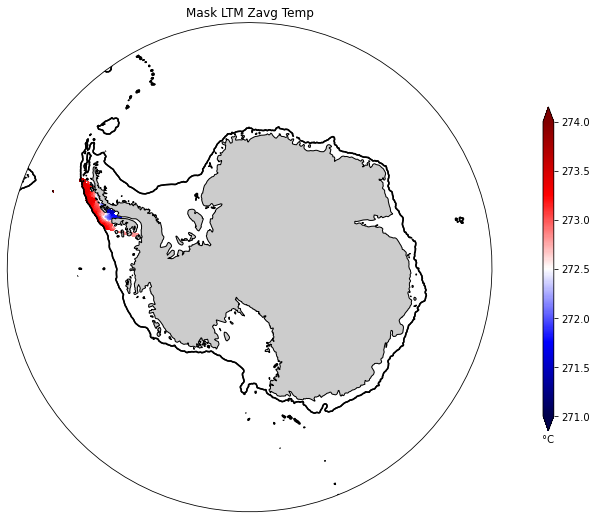

In [25]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

#anom=temp.where(tmask.tmask).sel(st_ocean=(200,700)).mean(dim='st_ocean')
#t=temp.isel(st_ocean=0)


p1 = ltm_temp_zavg.where(wap_mask.wap_mask).plot.pcolormesh(x='xt_ocean', y='yt_ocean', vmin=271, vmax=274, add_colorbar=False, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

#p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx73.values-decavg73_tx.values, ty73.values-decavg73_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('Mask LTM Zavg Temp')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');



In [23]:
shelf_t=np.zeros((60,4))
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/shelf_temp_200to500m_025_cycle2.nc',engine='netcdf4',decode_times=False)
shelf_t[:,0]=st.shelf_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/shelf_temp_200to500m_025_cycle3.nc',engine='netcdf4',decode_times=False)
shelf_t[:,1]=st.shelf_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/shelf_temp_200to500m_025_cycle4.nc',engine='netcdf4',decode_times=False)
shelf_t[:,2]=st.shelf_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/shelf_temp_200to500m_025_cycle5.nc',engine='netcdf4',decode_times=False)
shelf_t[:,3]=st.shelf_temp.load()
a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/025_cyc2to5_200to500_temp_shelf_ts.npy',shelf_t)


wap_t=np.zeros((60,4))
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/wap_temp_200to500m_025_cycle2.nc',engine='netcdf4',decode_times=False)
wap_t[:,0]=st.wap_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/wap_temp_200to500m_025_cycle3.nc',engine='netcdf4',decode_times=False)
wap_t[:,1]=st.wap_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/wap_temp_200to500m_025_cycle4.nc',engine='netcdf4',decode_times=False)
wap_t[:,2]=st.wap_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/wap_temp_200to500m_025_cycle5.nc',engine='netcdf4',decode_times=False)
wap_t[:,3]=st.wap_temp.load()
a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/025_cyc2to5_200to500_temp_wap_ts.npy',wap_t)


bs_t=np.zeros((60,4))
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/bs_temp_200to500m_025_cycle2.nc',engine='netcdf4',decode_times=False)
bs_t[:,0]=st.bs_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/bs_temp_200to500m_025_cycle3.nc',engine='netcdf4',decode_times=False)
bs_t[:,1]=st.bs_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/bs_temp_200to500m_025_cycle4.nc',engine='netcdf4',decode_times=False)
bs_t[:,2]=st.bs_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/bs_temp_200to500m_025_cycle5.nc',engine='netcdf4',decode_times=False)
bs_t[:,3]=st.bs_temp.load()
a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/025_cyc2to5_200to500_temp_bs_ts.npy',bs_t)

as_t=np.zeros((60,4))
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_200to500m_025_cycle2.nc',engine='netcdf4',decode_times=False)
as_t[:,0]=st.as_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_200to500m_025_cycle3.nc',engine='netcdf4',decode_times=False)
as_t[:,1]=st.as_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_200to500m_025_cycle4.nc',engine='netcdf4',decode_times=False)
as_t[:,2]=st.as_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/as_temp_200to500m_025_cycle5.nc',engine='netcdf4',decode_times=False)
as_t[:,3]=st.as_temp.load()
a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/025_cyc2to5_200to500_temp_as_ts.npy',as_t)

mb_t=np.zeros((60,4))
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/mb_temp_200to500m_025_cycle2.nc',engine='netcdf4',decode_times=False)
mb_t[:,0]=st.mb_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/mb_temp_200to500m_025_cycle3.nc',engine='netcdf4',decode_times=False)
mb_t[:,1]=st.mb_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/mb_temp_200to500m_025_cycle4.nc',engine='netcdf4',decode_times=False)
mb_t[:,2]=st.mb_temp.load()
st=xr.open_dataset('/g/data/v45/pas561/gdcc21/ensoant/data/mb_temp_200to500m_025_cycle5.nc',engine='netcdf4',decode_times=False)
mb_t[:,3]=st.mb_temp.load()
a=np.save('/g/data/v45/pas561/gdcc21/ensoant/data/025_cyc2to5_200to500_temp_mb_ts.npy',mb_t)


In [40]:
expt='025deg_jra55_iaf_omip2_cycle5'

start = '1958-01-01 00:00:00'
end = '1978-12-31 00:00:00'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).resample(time='Y').mean(dim='time').chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
#temp.load()
print(temp.shape)

print(thickness.shape)

temp_zavg = (temp*thickness).sum('st_ocean')/thickness.sum('st_ocean')
temp_zavg_all = temp_zavg.load()

#temp_zavg.to_dataset(name='temp_zavg').to_netcdf('temp_zavg_025_cycle2_200to500_58to78.nc')

(21, 50, 1080, 1440)
(5, 1080, 1440)


In [41]:
start = '1979-01-01 00:00:00'
end = '1998-12-31 00:00:00'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).resample(time='Y').mean(dim='time').chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
#temp.load()
print(temp.shape)
print(thickness.shape)

temp_zavg = (temp*thickness).sum('st_ocean')/thickness.sum('st_ocean')
temp_zavg.load()

temp_zavg_all=xr.concat([temp_zavg_all, temp_zavg],dim='time')
print(temp_zavg_all.shape)

#temp_zavg.to_dataset(name='temp_zavg').to_netcdf('temp_zavg_025_cycle2_200to500_79to98.nc')

(20, 50, 1080, 1440)
(5, 1080, 1440)
(41, 1080, 1440)


In [42]:
start = '1999-01-01 00:00:00'
end = '2017-12-31 00:00:00'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).resample(time='Y').mean(dim='time').chunk({'st_ocean':50, 'yt_ocean':540, 'xt_ocean':720})
#temp.load()
print(temp.shape)

print(thickness.shape)

temp_zavg = (temp*thickness).sum('st_ocean')/thickness.sum('st_ocean')
temp_zavg = temp_zavg.load()

temp_zavg_all=xr.concat([temp_zavg_all, temp_zavg],dim='time')
print(temp_zavg_all.shape)

temp_zavg_all.to_dataset(name='temp_zavg').to_netcdf('temp_zavg_025_cycle5_200to500_58to17.nc')

(19, 50, 1080, 1440)
(5, 1080, 1440)
(60, 1080, 1440)


In [93]:
#calculate area average from depth average
temp_zavg=xr.open_dataset('temp_zavg_025_cycle5_200to500_58to17.nc',engine='netcdf4',decode_times=False)
temp_zavg.load()

<xarray.Dataset>
Dimensions:    (time: 60, xt_ocean: 1440, yt_ocean: 1080)
Coordinates:
  * time       (time) int64 0 365 731 1096 1461 ... 20454 20819 21185 21550
  * xt_ocean   (xt_ocean) float64 -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
  * yt_ocean   (yt_ocean) float64 -81.08 -80.97 -80.87 ... 89.74 89.84 89.95
    geolat_t   (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
    geolon_t   (yt_ocean, xt_ocean) float32 nan nan nan nan ... nan nan nan nan
Data variables:
    temp_zavg  (time, yt_ocean, xt_ocean) float64 nan nan nan ... nan nan nan

In [94]:
temp_avg = temp_zavg.where(tmask.tmask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
wap_temp_avg = temp_zavg.where(wap_mask.wap_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
bs_temp_avg = temp_zavg.where(bs_mask.bs_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
as_temp_avg = temp_zavg.where(as_mask.as_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))
mb_temp_avg = temp_zavg.where(mb_mask.mb_mask).weighted(area_t).mean(dim=('xt_ocean','yt_ocean'))

In [95]:
print(temp_avg.values)
print(wap_temp_avg.values)
print(bs_temp_avg.values)
print(as_temp_avg.values)
print(mb_temp_avg.values)

<bound method Mapping.values of <xarray.Dataset>
Dimensions:    (time: 60)
Coordinates:
  * time       (time) int64 0 365 731 1096 1461 ... 20454 20819 21185 21550
Data variables:
    temp_zavg  (time) float64 272.0 272.0 272.0 271.9 ... 271.9 272.0 272.0>
<bound method Mapping.values of <xarray.Dataset>
Dimensions:    (time: 60)
Coordinates:
  * time       (time) int64 0 365 731 1096 1461 ... 20454 20819 21185 21550
Data variables:
    temp_zavg  (time) float64 273.1 273.0 272.9 272.8 ... 273.1 273.2 273.2>
<bound method Mapping.values of <xarray.Dataset>
Dimensions:    (time: 60)
Coordinates:
  * time       (time) int64 0 365 731 1096 1461 ... 20454 20819 21185 21550
Data variables:
    temp_zavg  (time) float64 273.1 273.0 273.0 272.9 ... 273.0 273.1 273.1>
<bound method Mapping.values of <xarray.Dataset>
Dimensions:    (time: 60)
Coordinates:
  * time       (time) int64 0 365 731 1096 1461 ... 20454 20819 21185 21550
Data variables:
    temp_zavg  (time) float64 273.1 273.1 273.1 2

In [96]:
temp_avg.temp_zavg.to_dataset(name='shelf_temp').to_netcdf('shelf_temp_200to500m_025_cycle5.nc')
wap_temp_avg.temp_zavg.to_dataset(name='wap_temp').to_netcdf('wap_temp_200to500m_025_cycle5.nc')
bs_temp_avg.temp_zavg.to_dataset(name='bs_temp').to_netcdf('bs_temp_200to500m_025_cycle5.nc')
as_temp_avg.temp_zavg.to_dataset(name='as_temp').to_netcdf('as_temp_200to500m_025_cycle5.nc')
mb_temp_avg.temp_zavg.to_dataset(name='mb_temp').to_netcdf('mb_temp_200to500m_025_cycle5.nc')

In [97]:
temp_avg.temp_zavg.shape

(60,)

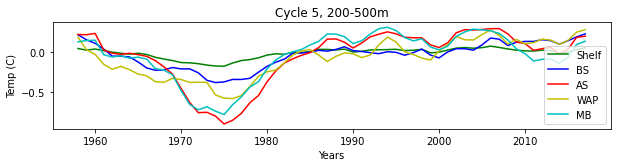

In [98]:
fig = plt.figure(figsize=(10, 9))

yrs=np.arange(1958,2018,1)

ts=(temp_avg-ltm_shelf_temp_avg).values
ts=(temp_avg-ltm_shelf_temp_avg).values

plt.subplot(411)
plt.plot(yrs,(temp_avg.temp_zavg-ltm_shelf_temp_avg).values,linestyle='-',color='g',label='Shelf',linewidth=1.5)
plt.plot(yrs,(bs_temp_avg.temp_zavg-ltm_bs_temp_avg).values,linestyle='-',color='b',label='BS',linewidth=1.5)
plt.plot(yrs,(as_temp_avg.temp_zavg-ltm_as_temp_avg).values,linestyle='-',color='r',label='AS',linewidth=1.5)
plt.plot(yrs,(wap_temp_avg.temp_zavg-ltm_wap_temp_avg).values,linestyle='-',color='y',label='WAP',linewidth=1.5)
plt.plot(yrs,(mb_temp_avg.temp_zavg-ltm_mb_temp_avg).values,linestyle='-',color='c',label='MB',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Cycle 5, 200-500m')
plt.legend(fontsize=10)

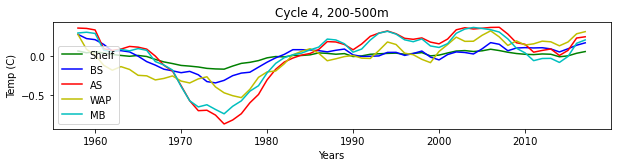

In [90]:
fig = plt.figure(figsize=(10, 9))

yrs=np.arange(1958,2018,1)

ts=(temp_avg-ltm_shelf_temp_avg).values
ts=(temp_avg-ltm_shelf_temp_avg).values

plt.subplot(411)
plt.plot(yrs,(temp_avg.temp_zavg-ltm_shelf_temp_avg).values,linestyle='-',color='g',label='Shelf',linewidth=1.5)
plt.plot(yrs,(bs_temp_avg.temp_zavg-ltm_bs_temp_avg).values,linestyle='-',color='b',label='BS',linewidth=1.5)
plt.plot(yrs,(as_temp_avg.temp_zavg-ltm_as_temp_avg).values,linestyle='-',color='r',label='AS',linewidth=1.5)
plt.plot(yrs,(wap_temp_avg.temp_zavg-ltm_wap_temp_avg).values,linestyle='-',color='y',label='WAP',linewidth=1.5)
plt.plot(yrs,(mb_temp_avg.temp_zavg-ltm_mb_temp_avg).values,linestyle='-',color='c',label='MB',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Cycle 4, 200-500m')
plt.legend(fontsize=10)

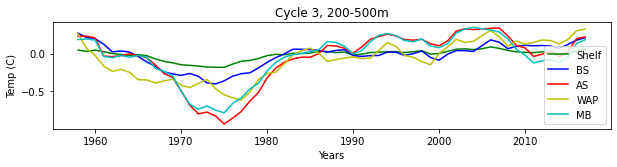

In [83]:
fig = plt.figure(figsize=(10, 9))

yrs=np.arange(1958,2018,1)

ts=(temp_avg-ltm_shelf_temp_avg).values
ts=(temp_avg-ltm_shelf_temp_avg).values

plt.subplot(411)
plt.plot(yrs,(temp_avg.temp_zavg-ltm_shelf_temp_avg).values,linestyle='-',color='g',label='Shelf',linewidth=1.5)
plt.plot(yrs,(bs_temp_avg.temp_zavg-ltm_bs_temp_avg).values,linestyle='-',color='b',label='BS',linewidth=1.5)
plt.plot(yrs,(as_temp_avg.temp_zavg-ltm_as_temp_avg).values,linestyle='-',color='r',label='AS',linewidth=1.5)
plt.plot(yrs,(wap_temp_avg.temp_zavg-ltm_wap_temp_avg).values,linestyle='-',color='y',label='WAP',linewidth=1.5)
plt.plot(yrs,(mb_temp_avg.temp_zavg-ltm_mb_temp_avg).values,linestyle='-',color='c',label='MB',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Cycle 3, 200-500m')
plt.legend(fontsize=10)

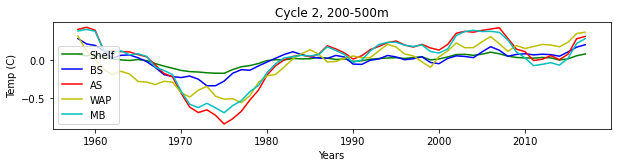

In [76]:
fig = plt.figure(figsize=(10, 9))

yrs=np.arange(1958,2018,1)

ts=(temp_avg-ltm_shelf_temp_avg).values
ts=(temp_avg-ltm_shelf_temp_avg).values

plt.subplot(411)
plt.plot(yrs,(temp_avg.temp_zavg-ltm_shelf_temp_avg).values,linestyle='-',color='g',label='Shelf',linewidth=1.5)
plt.plot(yrs,(bs_temp_avg.temp_zavg-ltm_bs_temp_avg).values,linestyle='-',color='b',label='BS',linewidth=1.5)
plt.plot(yrs,(as_temp_avg.temp_zavg-ltm_as_temp_avg).values,linestyle='-',color='r',label='AS',linewidth=1.5)
plt.plot(yrs,(wap_temp_avg.temp_zavg-ltm_wap_temp_avg).values,linestyle='-',color='y',label='WAP',linewidth=1.5)
plt.plot(yrs,(mb_temp_avg.temp_zavg-ltm_mb_temp_avg).values,linestyle='-',color='c',label='MB',linewidth=1.5)
#plt.ylim((1037.5,1035))
plt.ylabel('Temp (C)')
plt.xlabel('Years')
#plt.xlim([-75,85])
plt.title('Cycle 2, 200-500m')
plt.legend(fontsize=10)

temp_avg_c4=xr.open_mfdataset('*200to700m_025_cycle4.nc',engine='netcdf4',concat_dim='Time',decode_times=False)
temp_avg_c4

In [ ]:
print(ltm_temp_avg.values)

In [85]:
start = '1971-01-01 00:00:00'
end = '1972-01-01 00:00:00'

expt='025deg_jra55_iaf_omip2'
temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean(time)
#.where(bot_mask.umask)
#print(temp[]

VariableNotFoundError: No files were found containing 'temp' in the '025deg_jra55_iaf_omip2' experiment

Big El Nino event dates: 72/73, 82/83, 97/98, 15/16

#get decadal average around events
expt='025deg_jra55_iaf_omip2_cycle4'

start = '1968-01-01 00:00:00'
end = '1978-01-01 00:00:00'
decavg73_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_temp.shape

decavg73_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 72/72 event
start = '1978-01-01 00:00:00'
end = '1988-01-01 00:00:00'
decavg83_cyc1_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_cyc1_temp.shape

decavg83_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 97/98 event
start = '1993-01-01 00:00:00'
end = '2003-01-01 00:00:00'
decavg98_cyc1_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_cyc1_temp.shape

decavg98_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2008-01-01 00:00:00'
end = '2018-12-31 00:00:00'
decavg16_cyc1_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_cyc1_temp.shape

decavg16_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


In [ ]:
start = '1973-01-01 00:00:00'
end = '1974-01-01 00:00:00'
en73_c1_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

tx73 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty73 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '1983-01-01 00:00:00'
end = '1984-01-01 00:00:00'
en83_c1_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx83 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty83 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '1998-01-01 00:00:00'
end = '1999-01-01 00:00:00'
en98_c1_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx98 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty98 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2016-01-01 00:00:00'
end = '2017-01-01 00:00:00'
en16_c1_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx16 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty16 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

anom73=en73_c1_temp.sel(st_ocean=200, method='nearest')-decavg73_cyc1_temp.sel(st_ocean=200, method='nearest')
anom73.load()
print(anom73.shape)

anom83=en83_c1_temp.sel(st_ocean=200, method='nearest')-decavg83_cyc1_temp.sel(st_ocean=200, method='nearest')
anom83.load()
print(anom83.shape)

anom98=en98_c1_temp.sel(st_ocean=200, method='nearest')-decavg98_cyc1_temp.sel(st_ocean=200, method='nearest')
anom98.load()
print(anom98.shape)

anom16=en16_c1_temp.sel(st_ocean=200, method='nearest')-decavg16_cyc1_temp.sel(st_ocean=200, method='nearest')
anom16.load()
print(anom16.shape)

anom=en73_c1_temp.sel(st_ocean=200, method='nearest')-decavg73_cyc1_temp.sel(st_ocean=200, method='nearest')
anom.plot(vmin=-.5, vmax=+.5)

In [ ]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en73_c1_temp.sel(st_ocean=200, method='nearest')-decavg73_cyc1_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx73.values-decavg73_tx.values, ty73.values-decavg73_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, 1973 Big El Nino Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


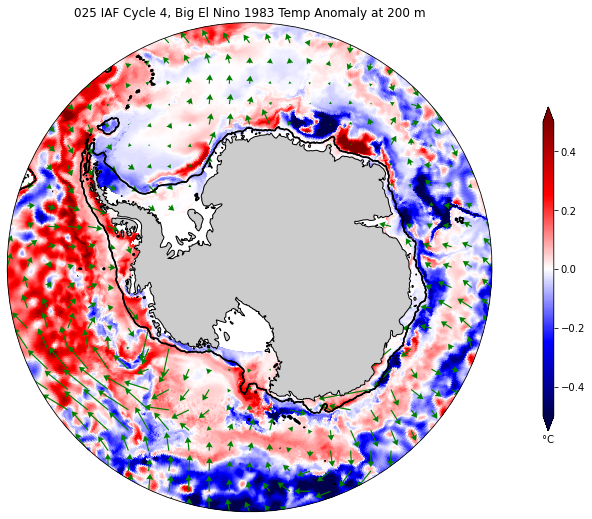

In [14]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_c1_temp.sel(st_ocean=200, method='nearest')-decavg83_cyc1_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())
p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx83.values-decavg83_tx.values, ty83.values-decavg83_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, Big El Nino 1983 Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


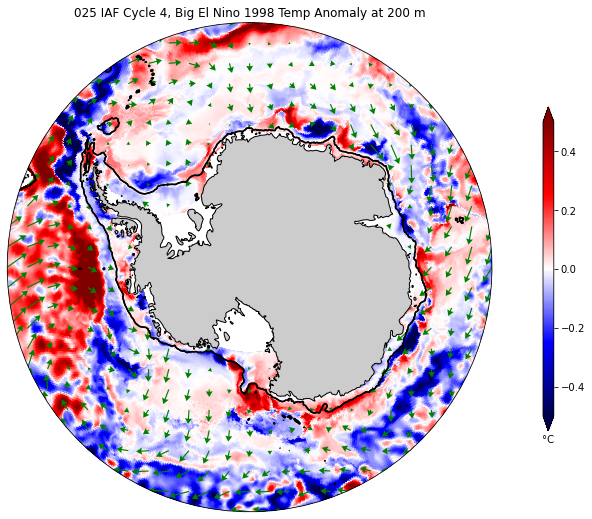

In [15]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_c1_temp.sel(st_ocean=200, method='nearest')-decavg98_cyc1_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, Big El Nino 1998 Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


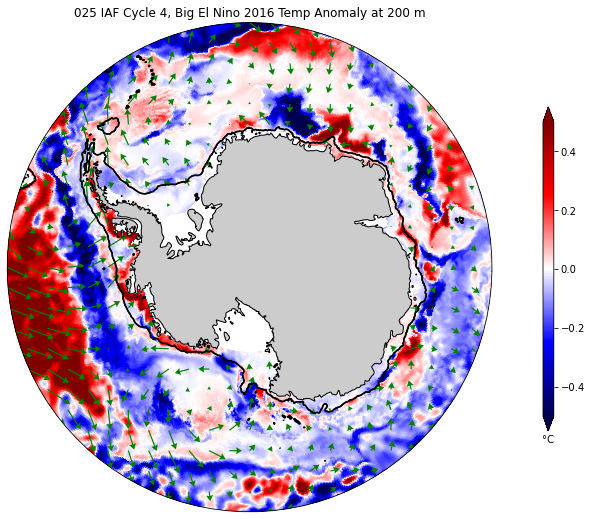

In [16]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en16_c1_temp.sel(st_ocean=200, method='nearest')-decavg16_cyc1_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())
p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx16.values-decavg16_tx.values, ty16.values-decavg16_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, Big El Nino 2016 Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


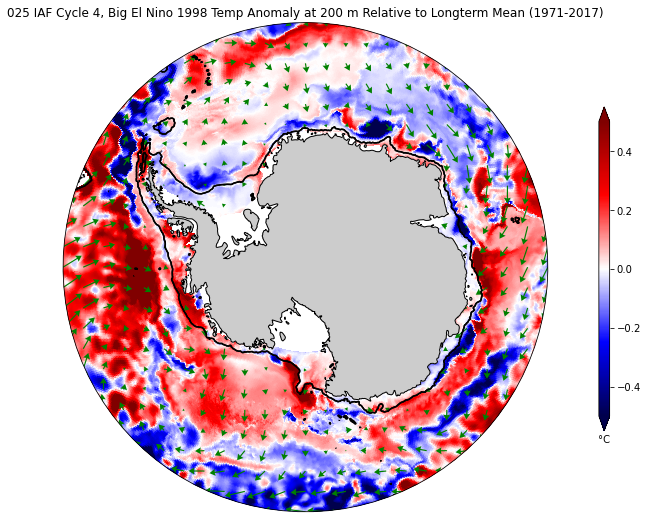

In [12]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_c1_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-ltm_tx.values, ty98.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, Big El Nino 1998 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


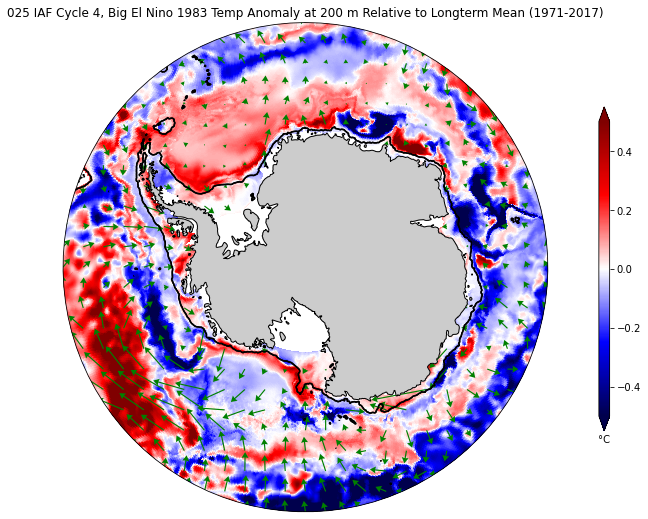

In [13]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_c1_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx83.values-ltm_tx.values, ty83.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, Big El Nino 1983 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


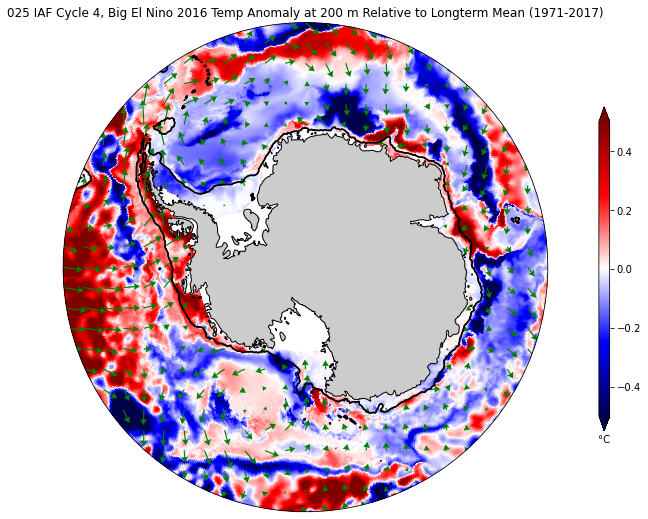

In [15]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en16_c1_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx16.values-ltm_tx.values, ty16.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, Big El Nino 2016 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

Big La Nina event dates: 88/89, 99/00, 07/08, 10/11

#get decadal average around events
expt='025deg_jra55_iaf_omip2_cycle4'

start = '1984-01-01 00:00:00'
end = '1994-01-01 00:00:00'
decavg89_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg89_temp.shape

decavg89_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg89_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 72/72 event
start = '1995-01-01 00:00:00'
end = '2005-01-01 00:00:00'
decavg00_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg00_temp.shape

decavg00_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg00_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 97/98 event
start = '2003-01-01 00:00:00'
end = '2013-01-01 00:00:00'
decavg08_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg08_temp.shape

decavg08_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg08_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2006-01-01 00:00:00'
end = '2016-01-01 00:00:00'
decavg11_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg11_temp.shape

decavg11_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg11_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


In [31]:
#Big La Nina event dates: 88/89, 99/00, 07/08, 10/11
expt='025deg_jra55_iaf_omip2_cycle4'
start = '1989-01-01 00:00:00'
end = '1990-01-01 00:00:00'
ln89_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

tx89 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty89 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2000-01-01 00:00:00'
end = '2001-01-01 00:00:00'
ln00_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx00 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty00 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2008-01-01 00:00:00'
end = '2009-01-01 00:00:00'
ln08_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx08 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty08 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2011-01-01 00:00:00'
end = '2012-01-01 00:00:00'
ln11_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx11 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty11 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

(1080, 1440)


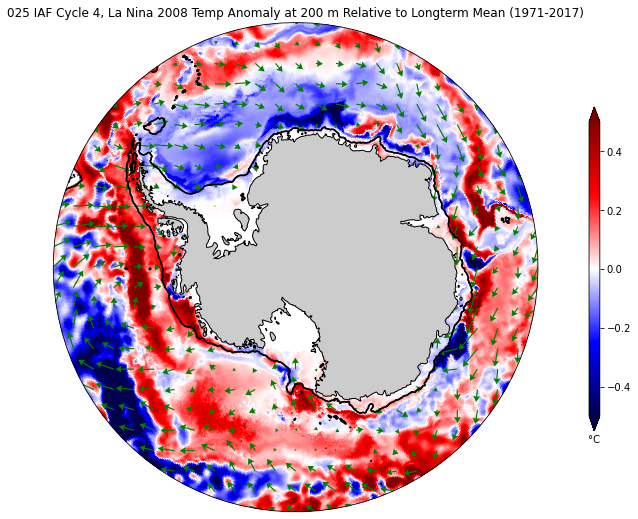

In [17]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln08_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx08.values-ltm_tx.values, ty08.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, La Nina 2008 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


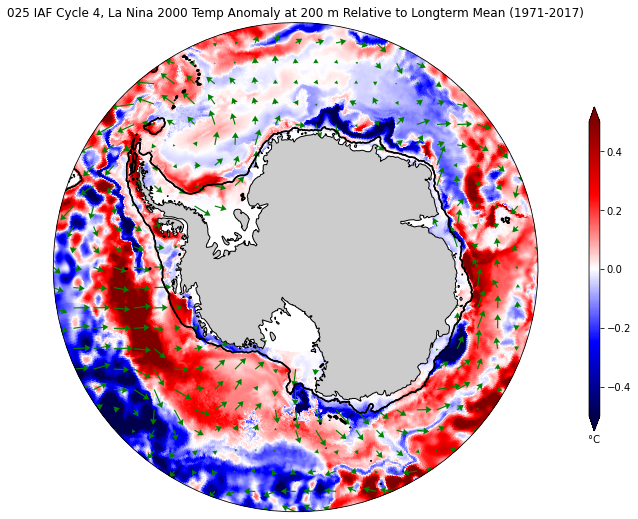

In [18]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln00_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx00.values-ltm_tx.values, ty00.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, La Nina 2000 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


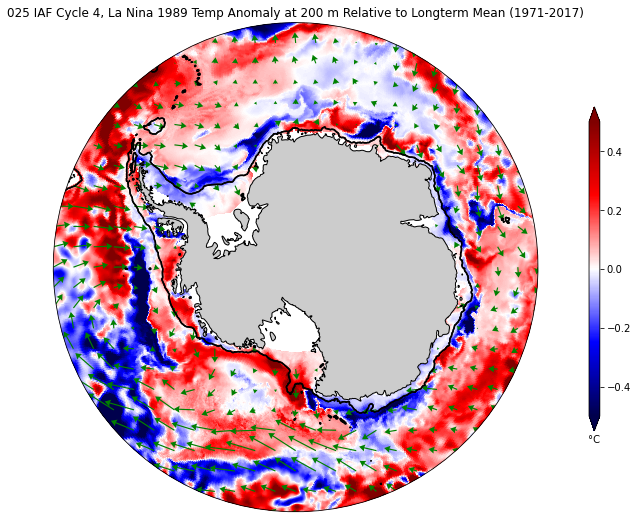

In [32]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln89_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx89.values-ltm_tx.values, ty89.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 4, La Nina 1989 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

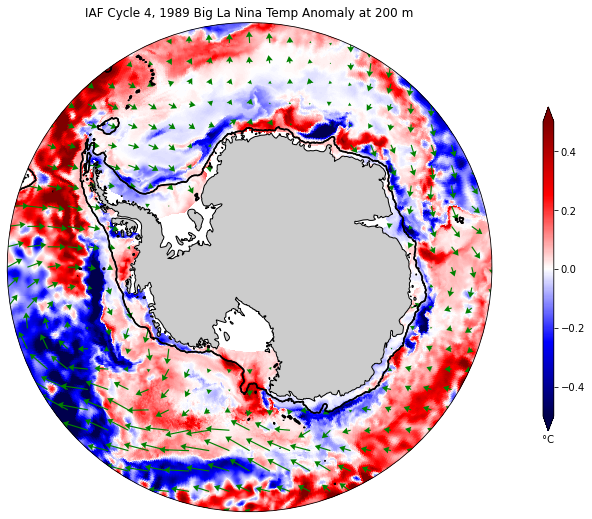

In [19]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln89_temp.sel(st_ocean=200, method='nearest')-decavg89_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx89.values-decavg89_tx.values, ty89.values-decavg89_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 4, 1989 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

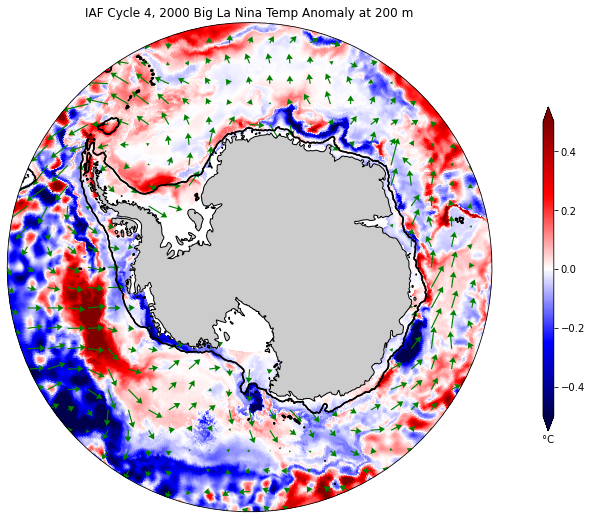

In [20]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln00_temp.sel(st_ocean=200, method='nearest')-decavg00_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx00.values-decavg00_tx.values, ty00.values-decavg00_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 4, 2000 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

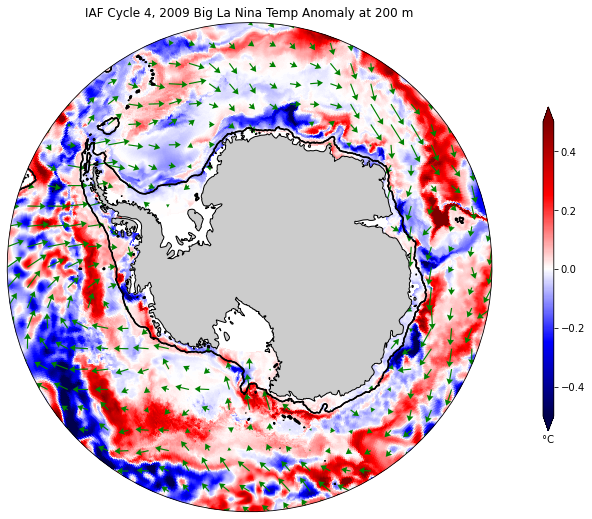

In [21]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln08_temp.sel(st_ocean=200, method='nearest')-decavg08_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx08.values-decavg08_tx.values, ty08.values-decavg08_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 4, 2009 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

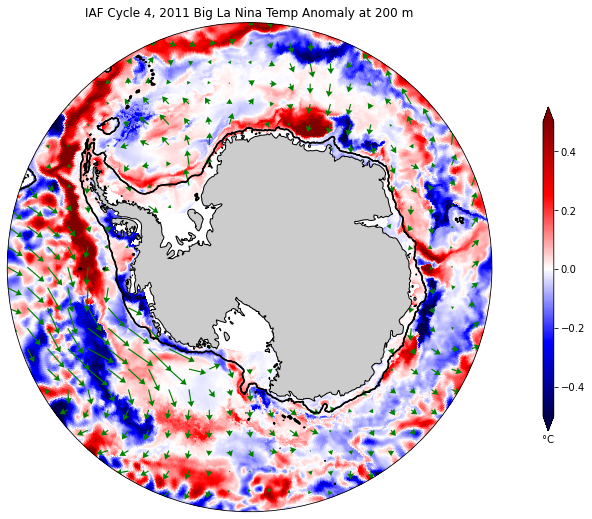

In [22]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln11_temp.sel(st_ocean=200, method='nearest')-decavg11_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx11.values-decavg11_tx.values, ty11.values-decavg11_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 4, 2011 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

Do Cycle 5: Big El Nino event dates: 72/73, 82/83, 97/98, 15/16

In [10]:
expt='025deg_jra55_iaf_omip2_cycle5'

In [11]:
#get long-term average for cycle 4
start = '1971-01-01 00:00:00'
end = '2017-01-01 00:00:00'
ltm_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ltm_temp.shape

(50, 1080, 1440)

In [13]:
start = '1971-01-01 00:00:00'
end = '2017-01-01 00:00:00'
ltm_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ltm_tx.load()
ltm_tx.shape

start = '1971-01-01 00:00:00'
end = '2017-01-01 00:00:00'
ltm_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ltm_ty.load()
ltm_ty.shape

(1080, 1440)

In [17]:
#get decadal average around events

start = '1968-01-01 00:00:00'
end = '1978-01-01 00:00:00'
decavg73_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_temp.shape

decavg73_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 72/72 event
start = '1978-01-01 00:00:00'
end = '1988-01-01 00:00:00'
decavg83_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_temp.shape

decavg83_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 97/98 event
start = '1993-01-01 00:00:00'
end = '2003-01-01 00:00:00'
decavg98_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_temp.shape

decavg98_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2008-01-01 00:00:00'
end = '2018-12-31 00:00:00'
decavg16_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_temp.shape

decavg16_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


In [14]:
start = '1973-01-01 00:00:00'
end = '1974-01-01 00:00:00'
en73_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

tx73 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty73 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '1983-01-01 00:00:00'
end = '1984-01-01 00:00:00'
en83_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx83 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty83 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '1998-01-01 00:00:00'
end = '1999-01-01 00:00:00'
en98_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx98 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty98 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2016-01-01 00:00:00'
end = '2017-01-01 00:00:00'
en16_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx16 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty16 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

(1080, 1440)


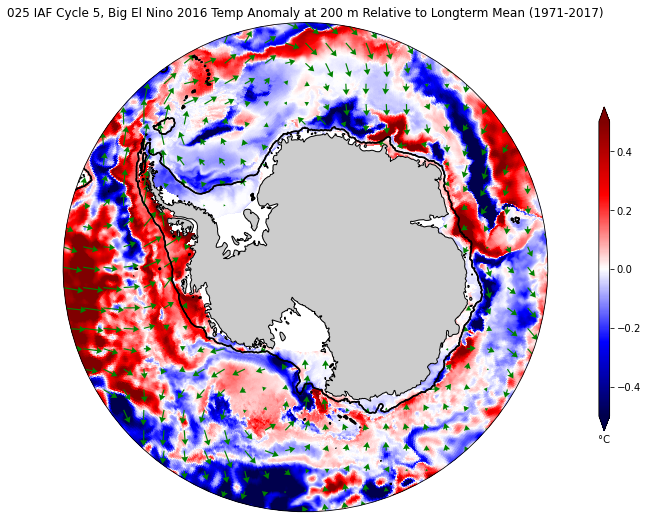

In [15]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en16_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx16.values-ltm_tx.values, ty16.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 5, Big El Nino 2016 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


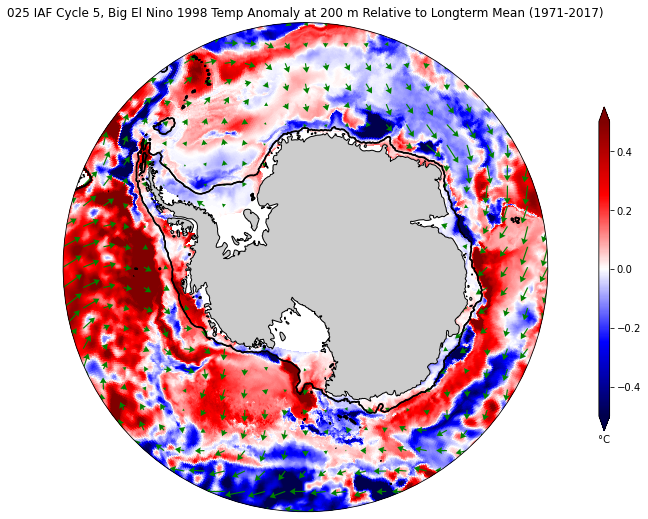

In [16]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-ltm_tx.values, ty98.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 5, Big El Nino 1998 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


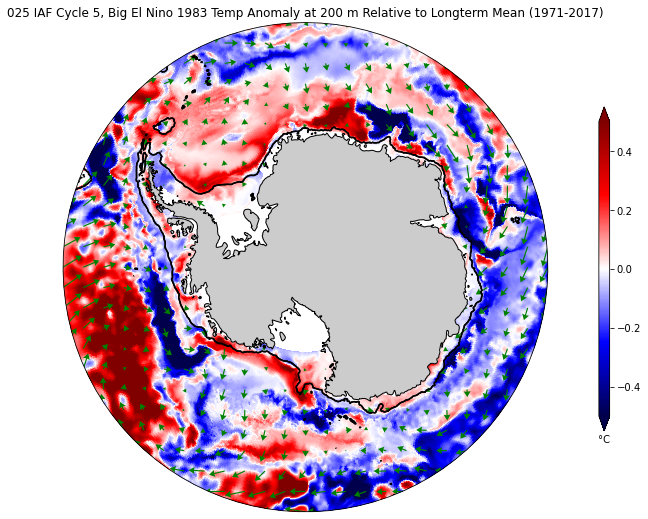

In [17]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-ltm_tx.values, ty98.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 5, Big El Nino 1983 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

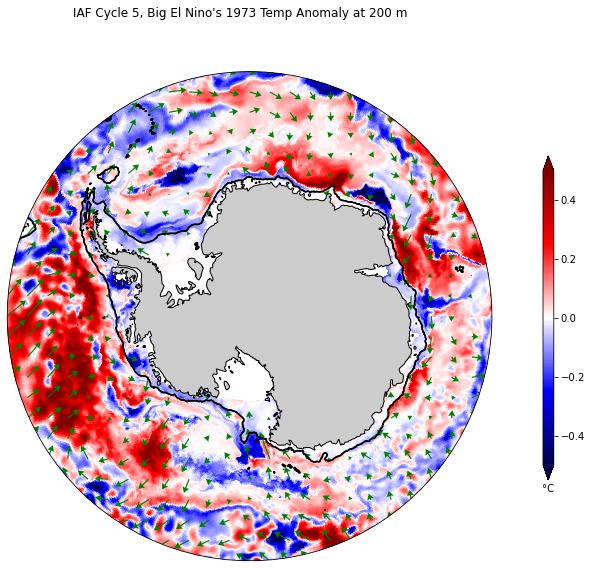

In [27]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 5, Big El Nino\'s 1973 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en73_temp.sel(st_ocean=200, method='nearest')-decavg73_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx73.values-decavg73_tx.values, ty73.values-decavg73_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

#IAFPertDir='/g/data/hh5/tmp/pas561/access-om2-jra-iaf'
#of = os.path.join(IAFPertDir,'Cycle5_OM2_025_JRA-IAF_Temp_LN_decanom.png')
#plt.savefig(of,dpi=220)

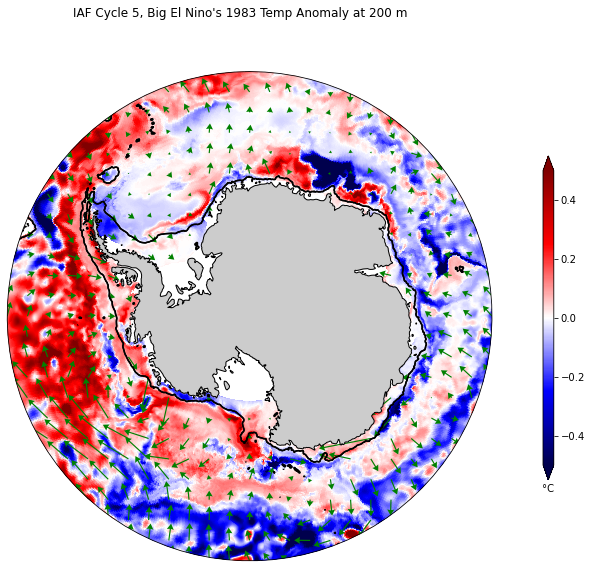

In [28]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 5, Big El Nino\'s 1983 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_temp.sel(st_ocean=200, method='nearest')-decavg83_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx83.values-decavg83_tx.values, ty83.values-decavg83_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');



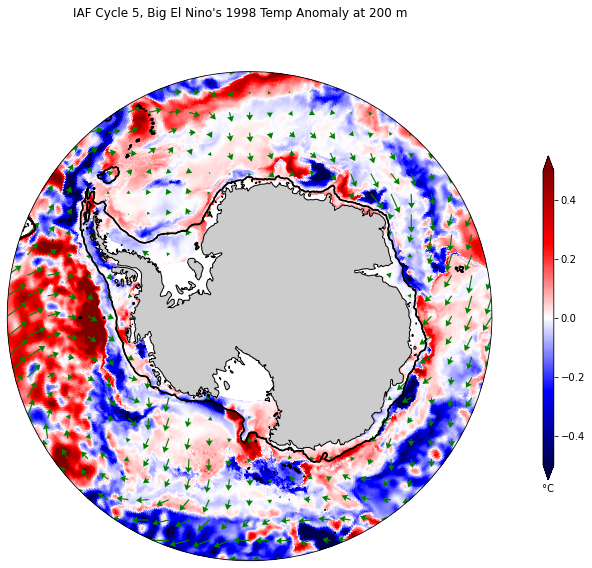

In [29]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 5, Big El Nino\'s 1998 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_temp.sel(st_ocean=200, method='nearest')-decavg98_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

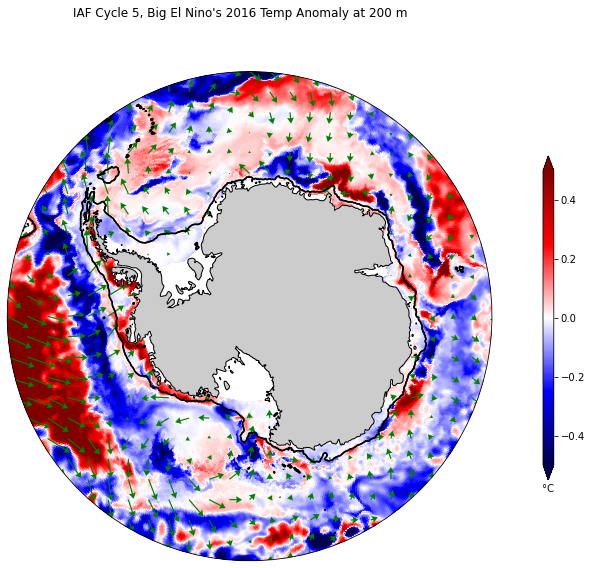

In [30]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 5, Big El Nino\'s 2016 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)


ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en16_temp.sel(st_ocean=200, method='nearest')-decavg16_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx16.values-decavg16_tx.values, ty16.values-decavg16_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');


(1080, 1440)


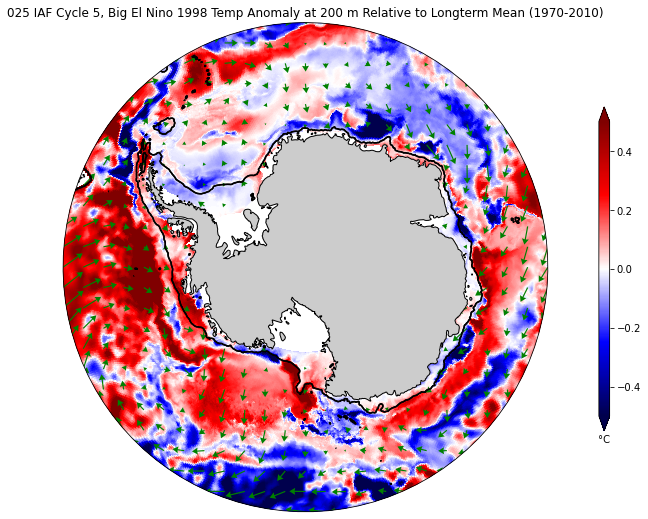

In [19]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 5, Big El Nino 1998 Temp Anomaly at 200 m Relative to Longterm Mean (1970-2010)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


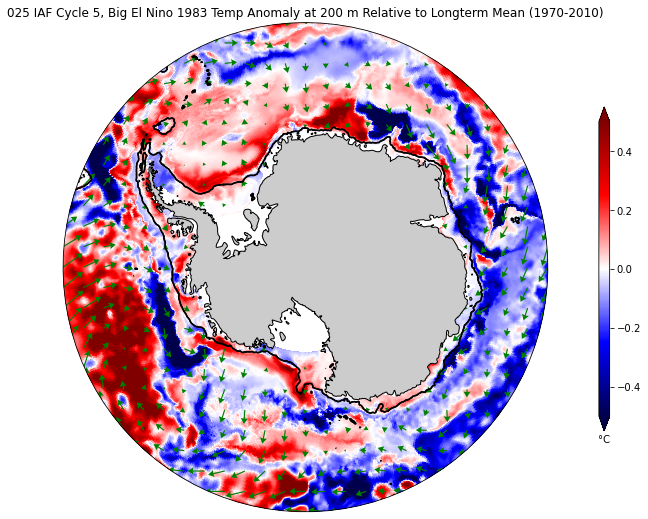

In [20]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 5, Big El Nino 1983 Temp Anomaly at 200 m Relative to Longterm Mean (1970-2010)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

Cycle 5 Big La Nina event dates: 88/89, 99/00, 07/08, 10/11

In [31]:
#get decadal average around events
expt='025deg_jra55_iaf_omip2_cycle5'

start = '1984-01-01 00:00:00'
end = '1994-01-01 00:00:00'
decavg89_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg89_temp.shape

decavg89_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg89_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 72/72 event
start = '1995-01-01 00:00:00'
end = '2005-01-01 00:00:00'
decavg00_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg00_temp.shape

decavg00_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg00_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 97/98 event
start = '2003-01-01 00:00:00'
end = '2013-01-01 00:00:00'
decavg08_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg08_temp.shape

decavg08_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg08_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2006-01-01 00:00:00'
end = '2016-01-01 00:00:00'
decavg11_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg11_temp.shape

decavg11_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg11_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


In [32]:
#Big La Nina event dates: 88/89, 99/00, 07/08, 10/11
start = '1989-01-01 00:00:00'
end = '1990-01-01 00:00:00'
ln89_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

tx89 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty89 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2000-01-01 00:00:00'
end = '2001-01-01 00:00:00'
ln00_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx00 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty00 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2008-01-01 00:00:00'
end = '2009-01-01 00:00:00'
ln08_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx08 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty08 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2011-01-01 00:00:00'
end = '2012-01-01 00:00:00'
ln11_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx11 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty11 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

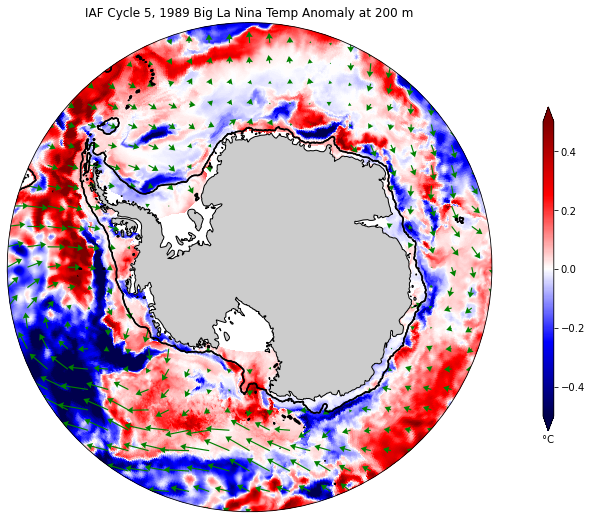

In [33]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln89_temp.sel(st_ocean=200, method='nearest')-decavg89_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx89.values-decavg89_tx.values, ty89.values-decavg89_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 5, 1989 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

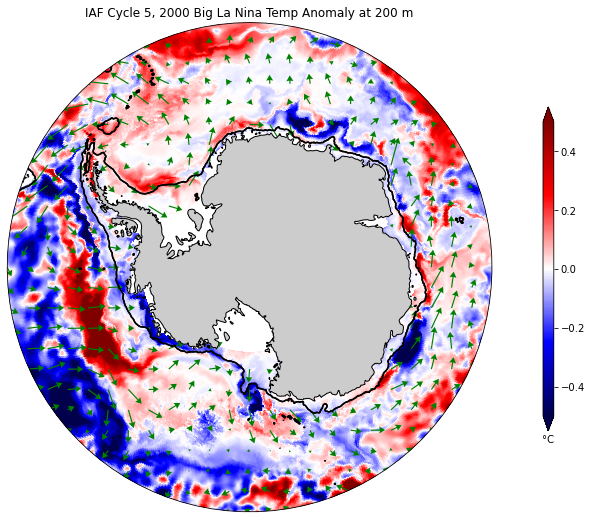

In [34]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln00_temp.sel(st_ocean=200, method='nearest')-decavg00_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx00.values-decavg00_tx.values, ty00.values-decavg00_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 5, 2000 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

Do Cycle 6: Big El Nino event dates: 72/73, 82/83, 97/98, 15/16

In [21]:
expt='025deg_jra55_iaf_omip2_cycle6'

In [22]:
#get long-term average for cycle 
start = '1971-01-01 00:00:00'
end = '2010-01-01 00:00:00'
ltm_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ltm_temp.shape

NameError: name 'ltm' is not defined

In [ ]:
#get decadal average around events

start = '1968-01-01 00:00:00'
end = '1978-01-01 00:00:00'
decavg73_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_temp.shape

decavg73_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 72/72 event
start = '1978-01-01 00:00:00'
end = '1988-01-01 00:00:00'
decavg83_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_temp.shape

decavg83_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 97/98 event
start = '1993-01-01 00:00:00'
end = '2003-01-01 00:00:00'
decavg98_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_temp.shape

decavg98_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2008-01-01 00:00:00'
end = '2018-12-31 00:00:00'
decavg16_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_temp.shape

decavg16_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


In [ ]:
start = '1973-01-01 00:00:00'
end = '1974-01-01 00:00:00'
en73_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

tx73 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty73 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '1983-01-01 00:00:00'
end = '1984-01-01 00:00:00'
en83_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx83 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty83 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '1998-01-01 00:00:00'
end = '1999-01-01 00:00:00'
en98_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx98 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty98 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2016-01-01 00:00:00'
end = '2017-01-01 00:00:00'
en16_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx16 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty16 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

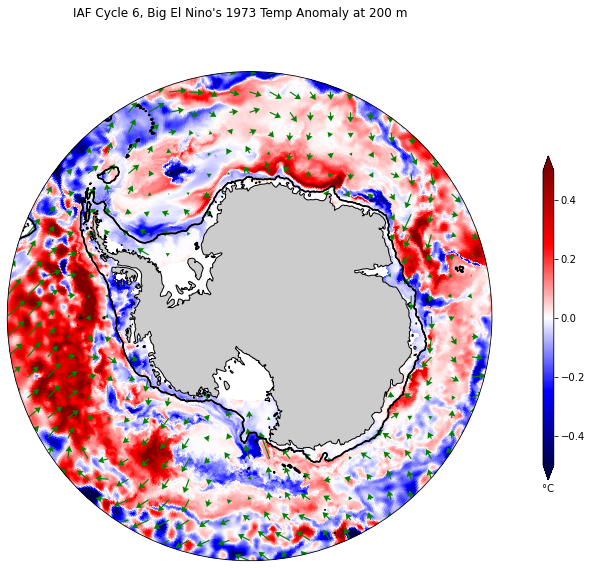

In [39]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 6, Big El Nino\'s 1973 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en73_temp.sel(st_ocean=200, method='nearest')-decavg73_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx73.values-decavg73_tx.values, ty73.values-decavg73_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

#IAFPertDir='/g/data/hh5/tmp/pas561/access-om2-jra-iaf'
#of = os.path.join(IAFPertDir,'Cycle5_OM2_025_JRA-IAF_Temp_LN_decanom.png')
#plt.savefig(of,dpi=220)

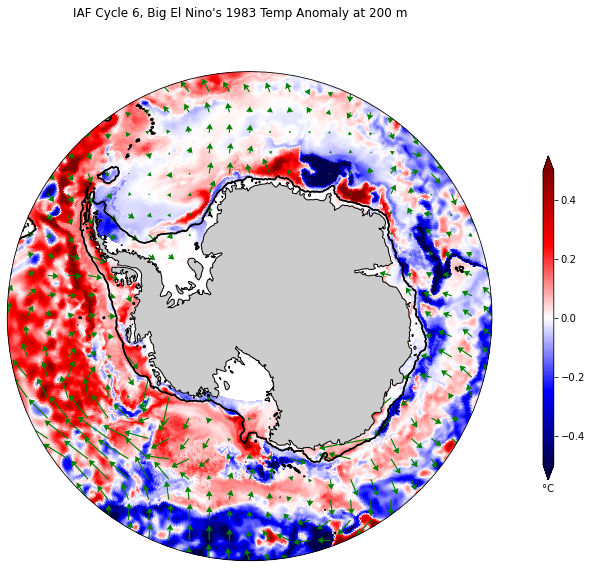

In [40]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 6, Big El Nino\'s 1983 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_temp.sel(st_ocean=200, method='nearest')-decavg83_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx83.values-decavg83_tx.values, ty83.values-decavg83_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');



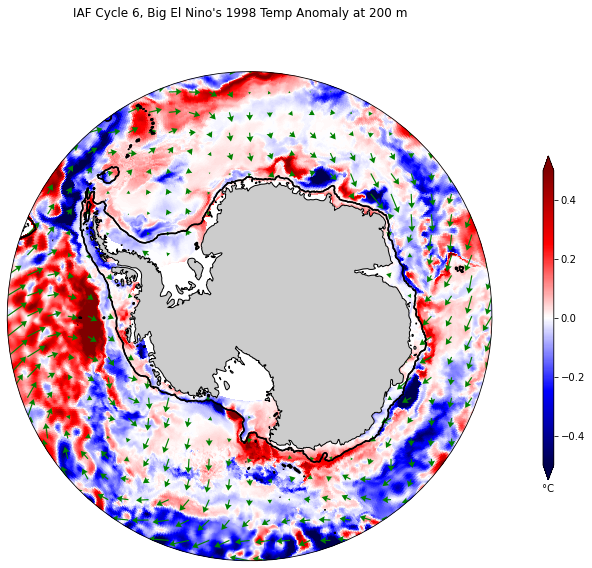

In [41]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 6, Big El Nino\'s 1998 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_temp.sel(st_ocean=200, method='nearest')-decavg98_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

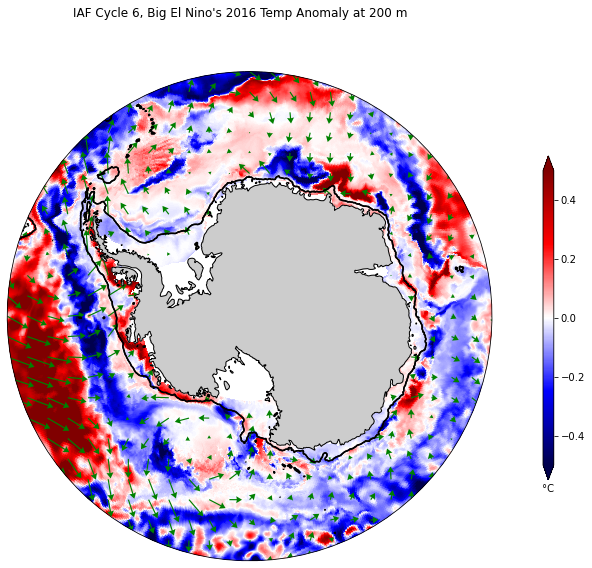

In [42]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 6, Big El Nino\'s 2016 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)


ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en16_temp.sel(st_ocean=200, method='nearest')-decavg16_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx16.values-decavg16_tx.values, ty16.values-decavg16_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');


(1080, 1440)


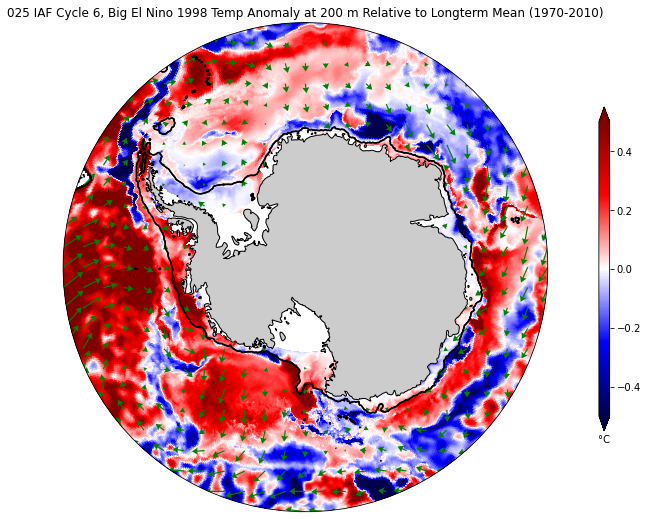

In [23]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en16_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx16.values-ltm_tx.values, ty16.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 6, Big El Nino 2016 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


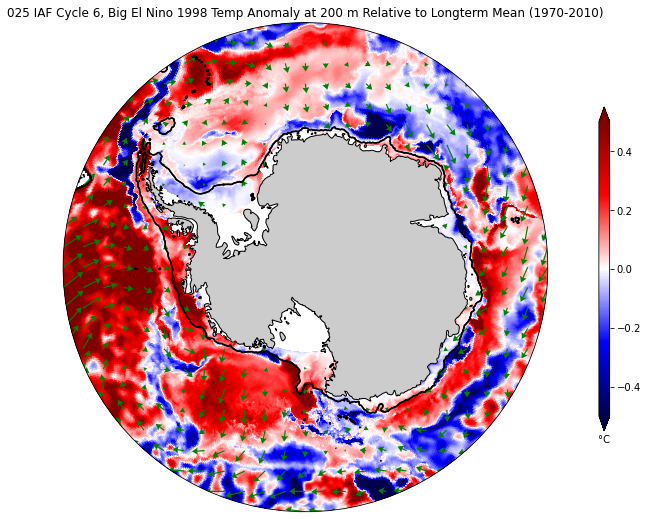

In [23]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-ltm_tx.values, ty98.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 6, Big El Nino 1998 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


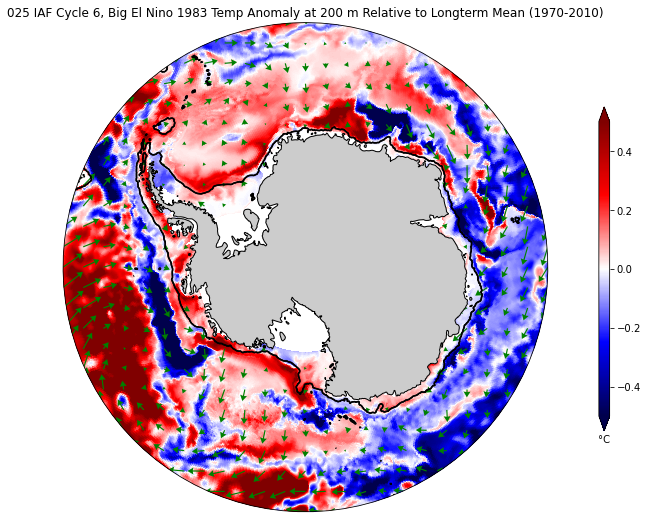

In [24]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-ltm_tx.values, ty98.values-ltm_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 6, Big El Nino 1983 Temp Anomaly at 200 m Relative to Longterm Mean (1971-2017)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

Cycle 6: Big La Nina event dates: 88/89, 99/00, 07/08, 10/11

In [46]:
#get decadal average around events
expt='025deg_jra55_iaf_omip2_cycle6'

start = '1984-01-01 00:00:00'
end = '1994-01-01 00:00:00'
decavg89_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg89_temp.shape

decavg89_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg89_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 72/72 event
start = '1995-01-01 00:00:00'
end = '2005-01-01 00:00:00'
decavg00_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg00_temp.shape

decavg00_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg00_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 97/98 event
start = '2003-01-01 00:00:00'
end = '2013-01-01 00:00:00'
decavg08_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg08_temp.shape

decavg08_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg08_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2006-01-01 00:00:00'
end = '2016-01-01 00:00:00'
decavg11_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg11_temp.shape

decavg11_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg11_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


In [47]:
#Big La Nina event dates: 88/89, 99/00, 07/08, 10/11
start = '1989-01-01 00:00:00'
end = '1990-01-01 00:00:00'
ln89_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

tx89 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty89 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2000-01-01 00:00:00'
end = '2001-01-01 00:00:00'
ln00_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx00 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty00 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2008-01-01 00:00:00'
end = '2009-01-01 00:00:00'
ln08_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx08 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty08 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2011-01-01 00:00:00'
end = '2012-01-01 00:00:00'
ln11_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx11 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty11 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

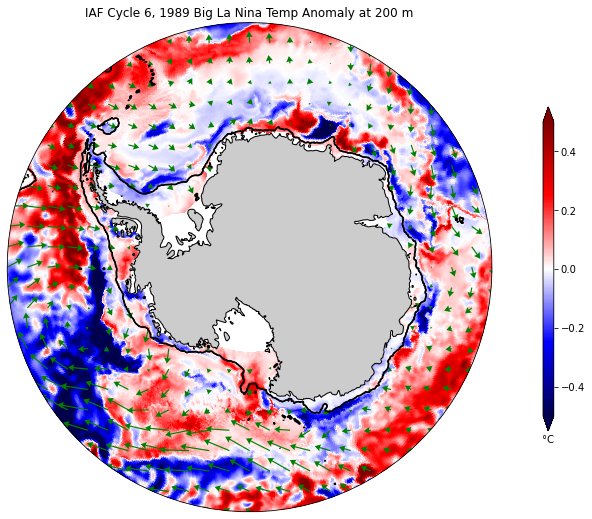

In [48]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln89_temp.sel(st_ocean=200, method='nearest')-decavg89_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx89.values-decavg89_tx.values, ty89.values-decavg89_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 6, 1989 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

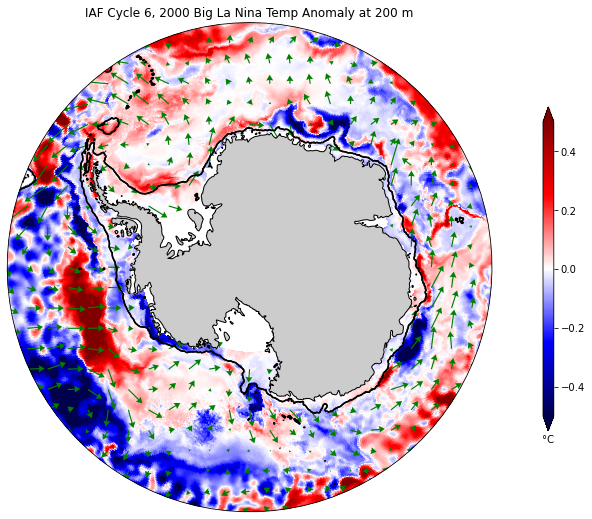

In [49]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln00_temp.sel(st_ocean=200, method='nearest')-decavg00_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx00.values-decavg00_tx.values, ty00.values-decavg00_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('IAF Cycle 6, 2000 Big La Nina Temp Anomaly at 200 m')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

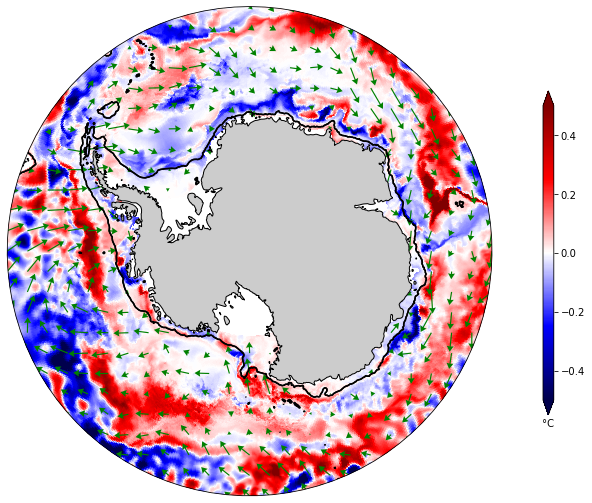

In [50]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')
plt.title('IAF Cycle 6, 2009 Big La Nina Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln08_temp.sel(st_ocean=200, method='nearest')-decavg08_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx08.values-decavg08_tx.values, ty08.values-decavg08_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

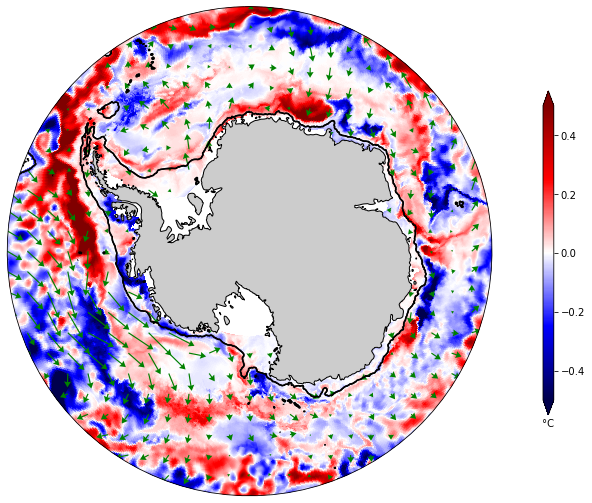

In [51]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')
plt.title('IAF Cycle 6, 2011 Big La Nina Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=ln11_temp.sel(st_ocean=200, method='nearest')-decavg11_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx11.values-decavg11_tx.values, ty11.values-decavg11_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

Do Cycle 2: Big El Nino event dates: 72/73, 82/83, 97/98, 15/16

In [25]:
expt='025deg_jra55_iaf_omip2_cycle2'

In [26]:
#get long-term average for cycle 
start = '1971-01-01 00:00:00'
end = '2010-01-01 00:00:00'
ltm_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ltm_temp.shape

(50, 1080, 1440)

In [27]:
#get decadal average around events

start = '1968-01-01 00:00:00'
end = '1978-01-01 00:00:00'
decavg73_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_temp.shape

decavg73_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg73_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 72/72 event
start = '1978-01-01 00:00:00'
end = '1988-01-01 00:00:00'
decavg83_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_temp.shape

decavg83_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg83_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


#get decadal average around 97/98 event
start = '1993-01-01 00:00:00'
end = '2003-01-01 00:00:00'
decavg98_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_temp.shape

decavg98_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg98_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '2008-01-01 00:00:00'
end = '2018-12-31 00:00:00'
decavg16_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_temp.shape

decavg16_tx = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
decavg16_ty = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


In [28]:
start = '1973-01-01 00:00:00'
end = '1974-01-01 00:00:00'
en73_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

tx73 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty73 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

start = '1983-01-01 00:00:00'
end = '1984-01-01 00:00:00'
en83_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx83 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty83 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '1998-01-01 00:00:00'
end = '1999-01-01 00:00:00'
en98_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx98 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty98 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')


start = '2016-01-01 00:00:00'
end = '2017-01-01 00:00:00'
en16_temp = cc.querying.getvar(expt, variable='temp', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
tx16 = cc.querying.getvar(expt, variable='tau_x', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')
ty16 = cc.querying.getvar(expt, variable='tau_y', 
                       session=session, frequency='1 monthly',
                       start_time=start, 
                       end_time=end).sel(time=slice(start,end)).mean('time')

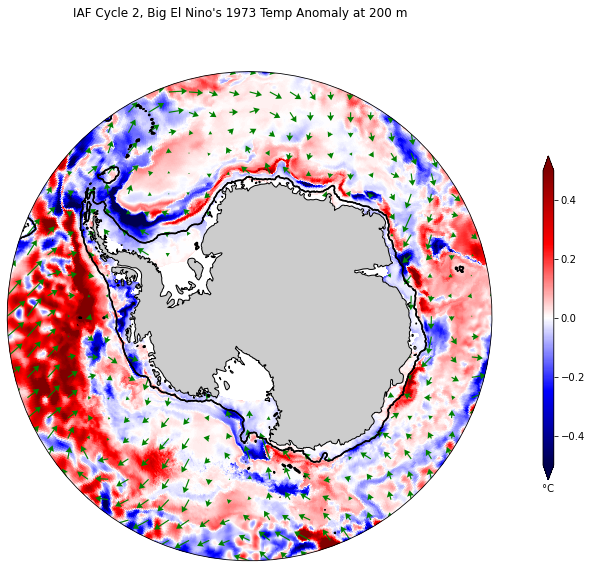

In [55]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 2, Big El Nino\'s 1973 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en73_temp.sel(st_ocean=200, method='nearest')-decavg73_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx73.values-decavg73_tx.values, ty73.values-decavg73_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

#IAFPertDir='/g/data/hh5/tmp/pas561/access-om2-jra-iaf'
#of = os.path.join(IAFPertDir,'Cycle5_OM2_025_JRA-IAF_Temp_LN_decanom.png')
#plt.savefig(of,dpi=220)

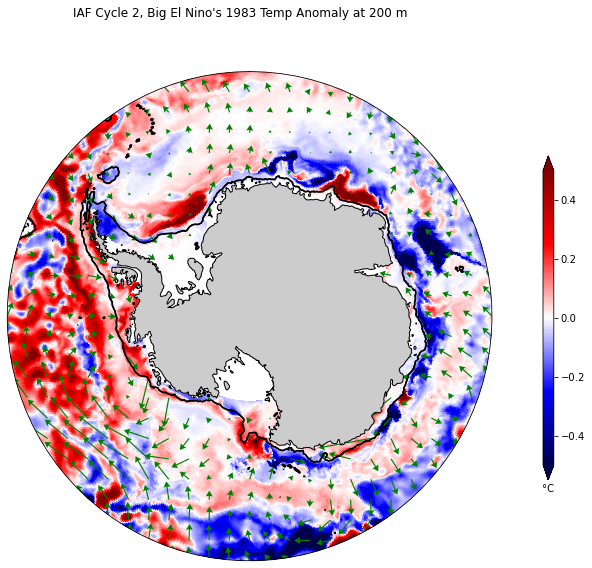

In [56]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 2, Big El Nino\'s 1983 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_temp.sel(st_ocean=200, method='nearest')-decavg83_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx83.values-decavg83_tx.values, ty83.values-decavg83_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');



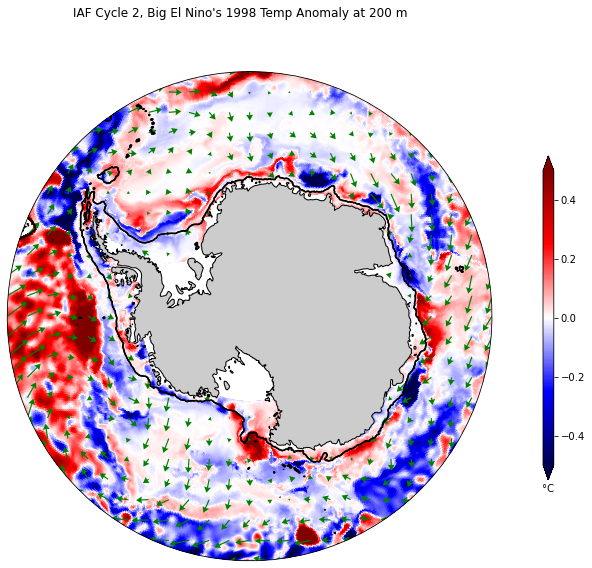

In [57]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 2, Big El Nino\'s 1998 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_temp.sel(st_ocean=200, method='nearest')-decavg98_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

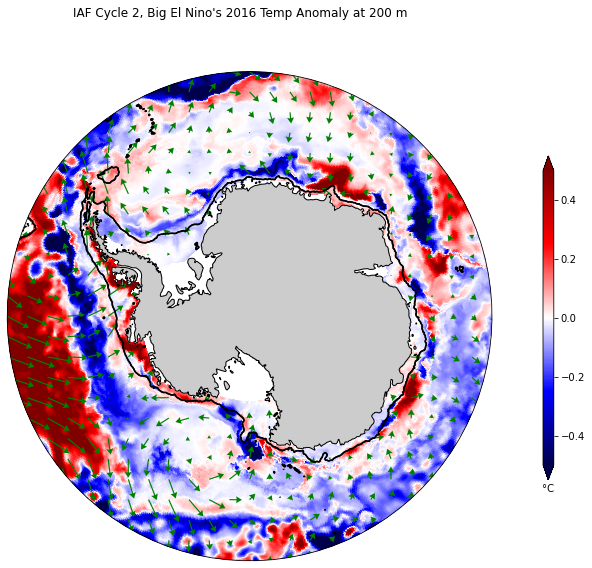

In [58]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
plt.suptitle('IAF Cycle 2, Big El Nino\'s 2016 Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)


ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en16_temp.sel(st_ocean=200, method='nearest')-decavg16_temp.sel(st_ocean=200, method='nearest')

p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx16.values-decavg16_tx.values, ty16.values-decavg16_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');


(1080, 1440)


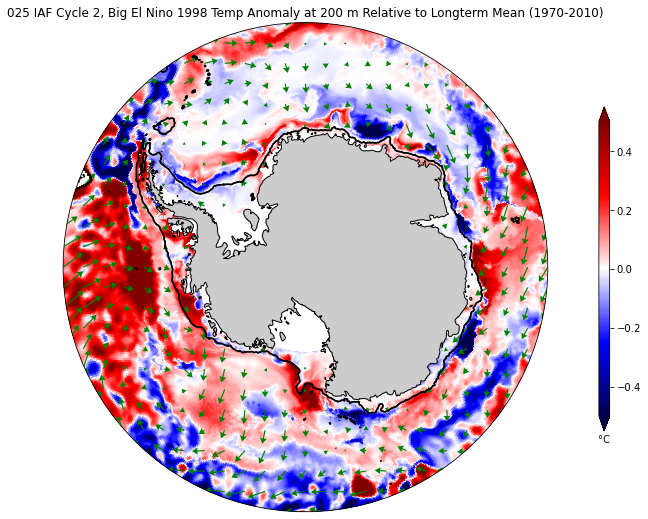

In [29]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en98_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 2, Big El Nino 1998 Temp Anomaly at 200 m Relative to Longterm Mean (1970-2010)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');

(1080, 1440)


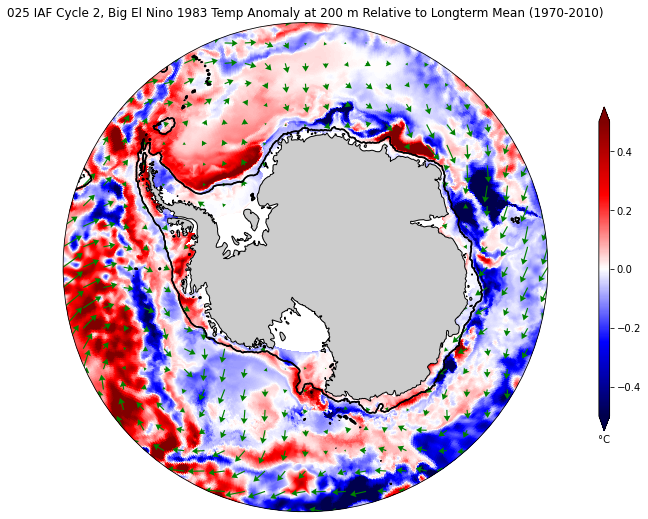

In [30]:
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10, 9))
#plt.suptitle('IAF Cycle 1, Big El Nino\'s Temp Anomaly at 200 m')

ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -55], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

anom=en83_temp.sel(st_ocean=200, method='nearest')-ltm_temp.sel(st_ocean=200, method='nearest')
anom.load()
print(anom.shape)


p1 = anom.plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=-.5, vmax=.5, cmap=plt.cm.seismic, extend='both', transform=ccrs.PlateCarree())
p2 = ht.plot.contour(ax=ax,
                       x='xt_ocean', y='yt_ocean', levels=2, vmin=999, vmax=1002, colors='k',linewidth=1,
                       transform=ccrs.PlateCarree())

p3=ax.quiver(xt_ocean.values, yt_ocean.values, tx98.values-decavg98_tx.values, ty98.values-decavg98_ty.values,color='g',headwidth=6,regrid_shape=25,transform=ccrs.PlateCarree())

plt.title('025 IAF Cycle 2, Big El Nino 1983 Temp Anomaly at 200 m Relative to Longterm Mean (1970-2010)')

ax_cb = plt.axes([0.92, 0.25, 0.015, 0.5])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical', extend='both')
cb.ax.set_xlabel('°C');